# Custom CNN (CIFAR10)

## Prework

### Install Packages

In [4]:
!pip install numpy matplotlib seaborn tensorflow[and-cuda] keras scikit-learn -U

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 68.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 71.1 MB/s eta 0:00:0000:0100:01
  Using cached numpy-2.0.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (19.5 MB)
  Using cached nvidia_cuda_nvrtc_cu12-12.5.82-py3-none-manylinux2014_x86_64.whl (24.9 MB)
  Using cached nvidia_cuda_runtime_cu12-12.5.82-py3-none-manylinux2014_x86_64.whl (895 kB)
  Using cached nvidia_cusolver_cu12-11.6.3.83-py3-none-manylinux2014_x86_64.whl (130.3 MB)
  Using cached nvidia_curand_cu12-10.3.6.82-py3-none-manylinux2014_x86_64.whl (56.3 MB)
  Using cached nvidia_nccl_cu12-2.21.5-py3-none-manylinux2014_x86_64.whl (188.7 MB)
  Using cached nvidia_cudnn_cu12-9.3.0.75-py3-none-manylinux2014_x86_64.whl (577.2 MB)
  Using cached nvidia_cufft_cu12-11.2.3.61-py3-none-manylinux2014_x86_64.whl (192.5 MB)
  Using cached nvidia_cub

### Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from datetime import datetime
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, UpSampling2D, Dropout, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Resizing
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

/home/mist861/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2024-12-10 11:07:20.592793: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-10 11:07:20.732789: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733850440.787181   19367 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory

In [2]:
# Double-check that CUDA is working
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


I0000 00:00:1733770860.526702 3181709 gpu_device.cc:2022] Created device /device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


True

### Define Methods

In [126]:
def plot_training(hist):

    # Print the exact metrics
    print(hist.history)

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

In [236]:
def plot_testing(model, classes, x, y):
    y_pred = np.argmax(model.predict(x), axis=-1)
    y_true = y.ravel()
    print("Testing Accuracy: ", accuracy_score(y_true,y_pred))
    cm = confusion_matrix(y_true,y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    fig, ax = plt.subplots(figsize=(15,15))
    disp.plot(ax=ax)
    plt.show()

### Importing the Cifar 10 Dataset

In [248]:
cifar10 = tf.keras.datasets.cifar10
(X_train, Y_train), (X_test,Y_test) = cifar10.load_data()

###  Plotting some images from the dataset

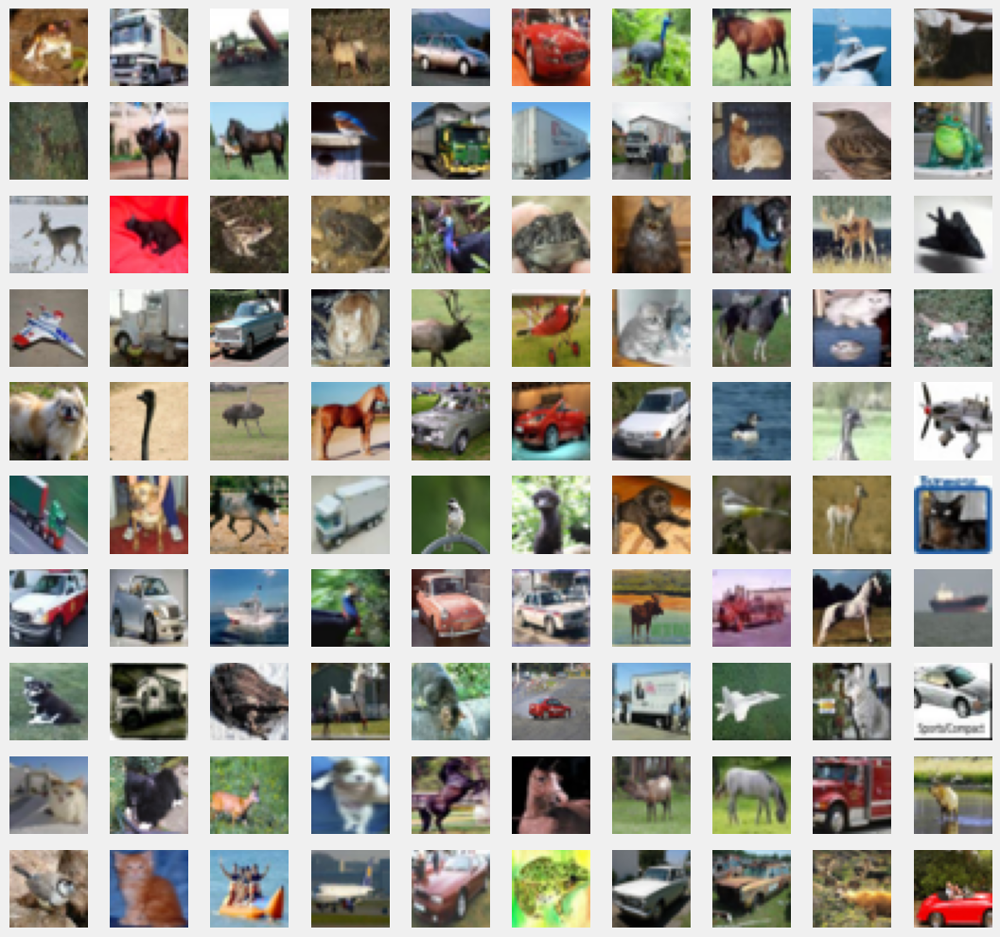

In [82]:
plt.figure(figsize=(12,12))
for i in range(100):
  plt.subplot(10,10,1+i)
  plt.axis('off')
  plt.imshow(X_train[i],cmap='gray')

### Splitting the train data again - we use the val set as test set and previous test set for final predictions

In [249]:
x_train,x_val,y_train,y_val = train_test_split(X_train, Y_train, test_size = 0.2)

###  Defining the classes

In [112]:
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ships', 'truck']

In [250]:
y_train = to_categorical(y_train, num_classes = 10)
y_val = to_categorical(y_val, num_classes = 10)
#y_test = to_categorical(Y_test, num_classes = 10)

In [251]:
x_train = x_train * 1.0/255
x_val = x_val * 1.0/255
X_test = X_test * 1.0/255

In [252]:
print(x_train.shape, x_val.shape, X_test.shape)
print(y_train.shape, y_val.shape, Y_test.shape)

(40000, 32, 32, 3) (10000, 32, 32, 3) (10000, 32, 32, 3)
(40000, 10) (10000, 10) (10000, 10)


###  Image Data Augmentation

In [60]:
train_datagen = ImageDataGenerator(
        rotation_range = 10,
        zoom_range = 0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.1,
        horizontal_flip = True,
        vertical_flip = False
        )
train_datagen.fit(x_train)

###  Reduce Learning Rate if accuracy is not improving for 3 epochs

In [61]:
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    factor=0.6,
    min_lr=1e-6)

## First Attempt

### Building the CNN

In [2]:
model = tf.keras.models.Sequential()
model.add(Input((32, 32, 3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(10, activation='softmax'))

model.summary()

I0000 00:00:1733850469.750207   19367 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,554,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,821,514 (26.02 MB)

 Trainable params: 6,819,850 (26.02 MB)

 Non-trainable params: 1,664 (6.50 KB)

### Stochastic gradient descent optimizer with momentum.

In [269]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9)

Compile the model

In [270]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [271]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 20,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.2162 - loss: 2.4370 - val_accuracy: 0.3436 - val_loss: 1.7931 - learning_rate: 0.1000
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.3522 - loss: 1.7864 - val_accuracy: 0.3775 - val_loss: 1.6646 - learning_rate: 0.1000
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.4084 - loss: 1.6166 - val_accuracy: 0.4381 - val_loss: 1.5490 - learning_rate: 0.1000
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.4613 - loss: 1.4844 - val_accuracy: 0.4589 - val_loss: 1.5253 - learning_rate: 0.1000
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.4941 - loss: 1.4193 - val_accuracy: 0.1103 - val_loss: 4.0615 - learning_rate: 0.1000
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.3230 - loss: 1.8321 - val_accuracy: 0.1779 - val_loss: 3.2888 - learning_rate: 0.1000
Epoch 7/20

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.06000000089406

In [272]:
model.summary()

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_119 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_120 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_84          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_121 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_122 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_21 (Flatten)            │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 512)            │     6,554,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_85          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_46 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_86          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_47 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,641,366 (52.04 MB)

 Trainable params: 6,819,850 (26.02 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 6,819,852 (26.02 MB)

### Accuracy and Loss

{'accuracy': [0.2681249976158142, 0.36320000886917114, 0.4217750132083893, 0.4745999872684479, 0.4369249939918518, 0.3510749936103821, 0.4083249866962433, 0.44495001435279846, 0.4555250108242035, 0.46560001373291016, 0.4847249984741211, 0.4967750012874603, 0.5028499960899353, 0.508774995803833, 0.43549999594688416, 0.4897499978542328, 0.5070750117301941, 0.5163249969482422, 0.5317249894142151, 0.5374249815940857], 'loss': [2.091398000717163, 1.7418420314788818, 1.584081768989563, 1.4560692310333252, 1.5650073289871216, 1.7671818733215332, 1.6277673244476318, 1.5332484245300293, 1.5032333135604858, 1.4800736904144287, 1.4233217239379883, 1.4017301797866821, 1.386778473854065, 1.370097279548645, 1.563853144645691, 1.4201757907867432, 1.3729544878005981, 1.3466064929962158, 1.3151297569274902, 1.292599081993103], 'val_accuracy': [0.34360000491142273, 0.3774999976158142, 0.43810001015663147, 0.45890000462532043, 0.11029999703168869, 0.17790000140666962, 0.30250000953674316, 0.1915999948978

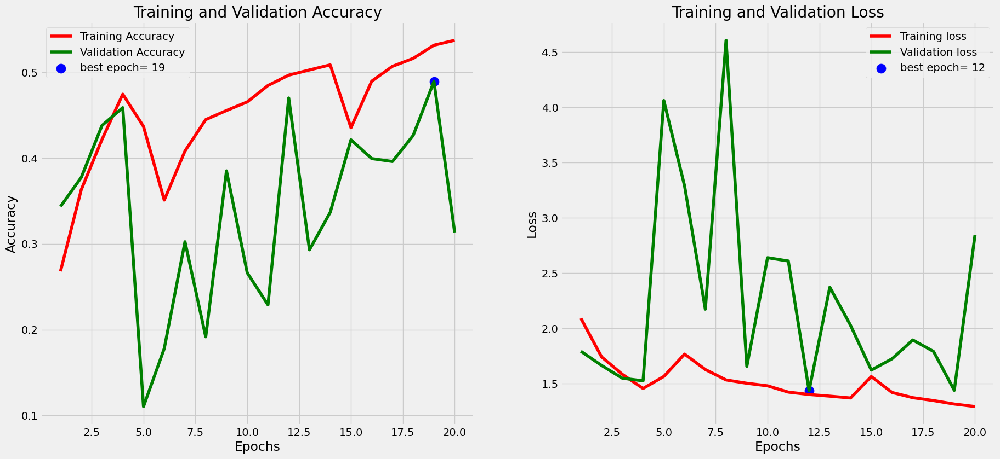

In [273]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   
Testing Accuracy:  0.3143


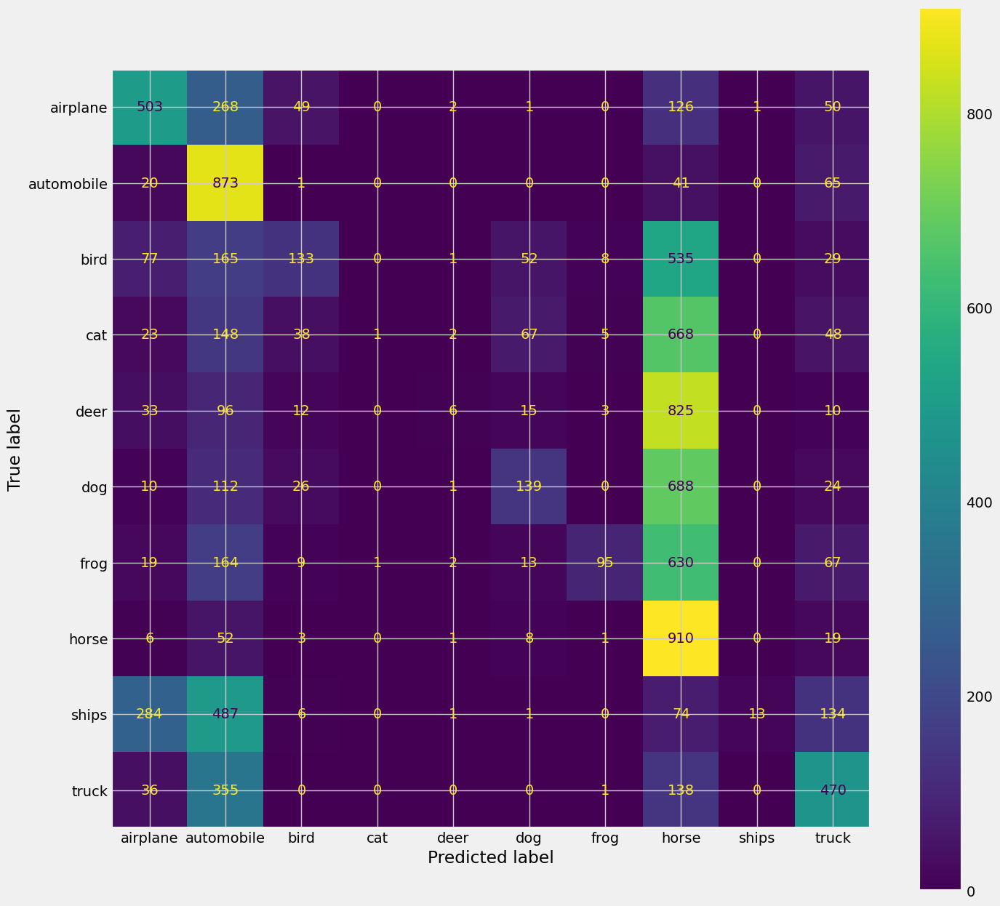

In [274]:
plot_testing(model, classes, X_test, Y_test)

## Final Attempt

### Building the CNN

In [275]:
model = tf.keras.models.Sequential()
model.add(Input((32, 32, 3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(GlobalAveragePooling2D())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(10, activation='softmax'))

model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_88          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_89          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,450 (1.27 MB)

 Trainable params: 331,786 (1.27 MB)

 Non-trainable params: 1,664 (6.50 KB)

### Define the Optimizer

In [276]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

### Compile the model

In [277]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [279]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - accuracy: 0.3421 - loss: 1.8328 - val_accuracy: 0.4972 - val_loss: 1.3909 - learning_rate: 0.0010
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.5278 - loss: 1.3204 - val_accuracy: 0.4297 - val_loss: 2.0113 - learning_rate: 0.0010
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.6036 - loss: 1.1113 - val_accuracy: 0.5553 - val_loss: 1.3535 - learning_rate: 0.0010
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.6513 - loss: 0.9878 - val_accuracy: 0.6322 - val_loss: 1.0598 - learning_rate: 0.0010
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.6771 - loss: 0.9078 - val_accuracy: 0.6839 - val_loss: 0.9273 - learning_rate: 0.0010
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.7037 - loss: 0.8390 - val_accuracy: 0.5966 - val_loss: 1.3002 - learning_rate: 0.0010
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.7231 - loss: 0.

In [281]:
model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_88          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_89          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 997,024 (3.80 MB)

 Trainable params: 331,786 (1.27 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 663,574 (2.53 MB)

### Accuracy and Loss

{'accuracy': [0.4062750041484833, 0.54892498254776, 0.6121249794960022, 0.6568499803543091, 0.682699978351593, 0.7052000164985657, 0.7238749861717224, 0.7337250113487244, 0.7487999796867371, 0.7564749717712402, 0.7828750014305115, 0.7899249792098999, 0.7974249720573425, 0.8011000156402588, 0.8058249950408936, 0.8122749924659729, 0.8132249712944031, 0.8178750276565552, 0.8186500072479248, 0.822350025177002, 0.8281499743461609, 0.8400750160217285, 0.8447999954223633, 0.848675012588501, 0.8522250056266785, 0.8499749898910522, 0.853725016117096, 0.8567249774932861, 0.8575500249862671, 0.8572250008583069], 'loss': [1.6427724361419678, 1.2637250423431396, 1.0829375982284546, 0.9717497825622559, 0.893471896648407, 0.8387359380722046, 0.7879418134689331, 0.7559791207313538, 0.7136191129684448, 0.6980616450309753, 0.62095046043396, 0.5996521711349487, 0.5813060402870178, 0.5704869031906128, 0.556675374507904, 0.5430490970611572, 0.5329187512397766, 0.5206660628318787, 0.5187163949012756, 0.5046

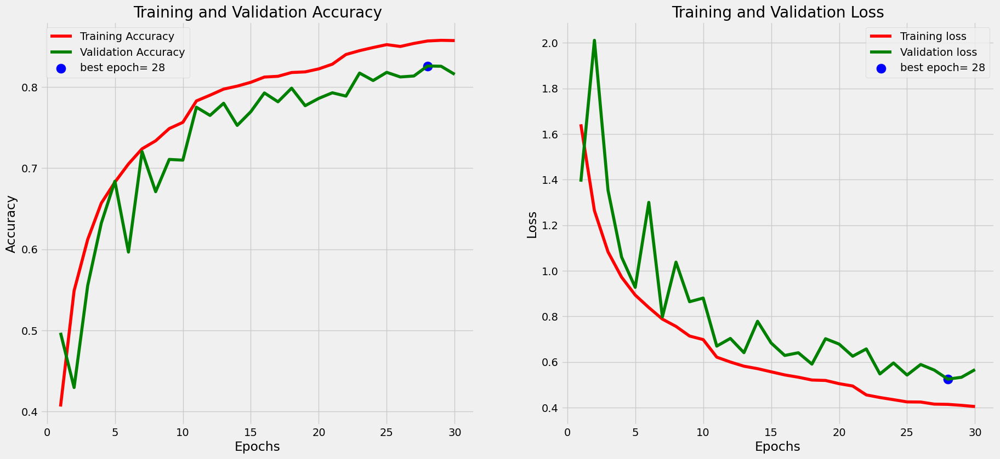

In [282]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.8119


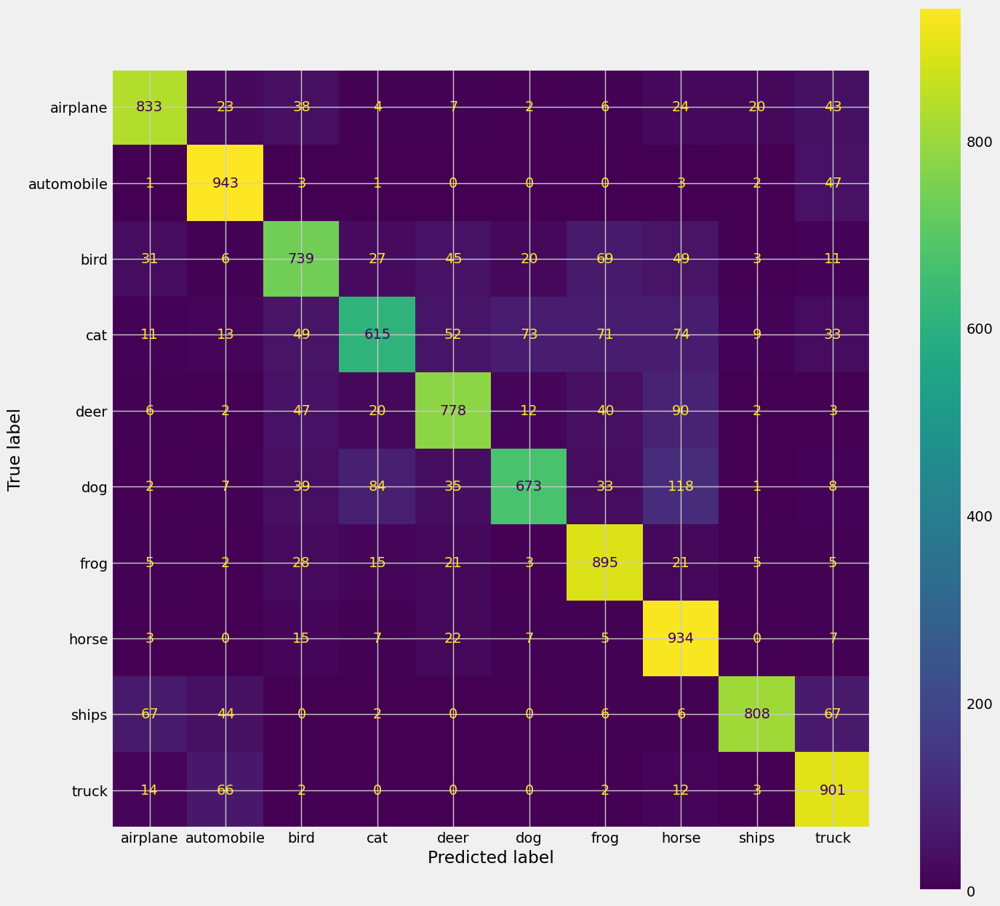

In [283]:
plot_testing(model, classes, X_test, Y_test)

### Predict Some Images

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step


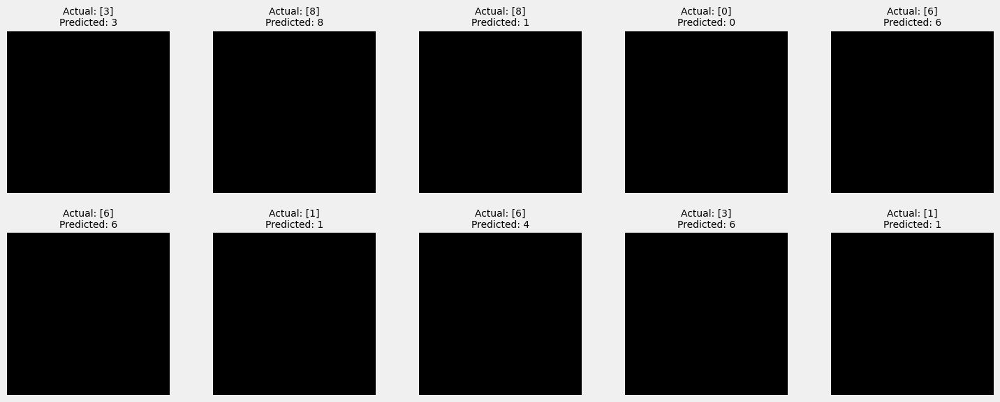

In [286]:
# Ensure the model has been used to make predictions on x_test
y_pred_prob = model.predict(X_test)
y_pred = y_pred_prob.argmax(axis=-1)  # Get the class predictions

# Define the number of images to display
num_images = 10
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # Display in a 2x5 grid

for i, ax in enumerate(axes.flat):
    # Display the image
    ax.imshow(X_test[i].astype("uint8"))  # Ensure the image is uint8 for correct display
    
    # Set the title with actual and predicted labels
    actual_label = Y_test[i]
    predicted_label = y_pred[i]
    ax.set_title(f"Actual: {actual_label}\nPredicted: {predicted_label}", fontsize=10)
    
    # Remove the axes for a cleaner look
    ax.axis('off')

plt.tight_layout()
plt.show()

It just occurred to me that we flattened all the images into arrays of numbers, meaning...  They won't be visible like this.  Oops.

### Save the Model

In [284]:
model.save('./custom_cnn.keras')

# Custom CNN (CIFAR100 FROZEN/TRANSFER-LEARNING)

## Prework

### Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from datetime import datetime
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, UpSampling2D, Dropout, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Resizing
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import load_model

/home/mist861/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2024-12-06 20:04:16.040374: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-06 20:04:16.160530: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733537056.212466    3518 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory

In [2]:
# Double-check that CUDA is working
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


I0000 00:00:1733537058.586666    3518 gpu_device.cc:2022] Created device /device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


True

### Define Methods

In [3]:
def plot_training(hist):

    # Print the exact metrics
    print(hist.history)

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

In [4]:
def plot_testing(model, classes, x, y):
    y_pred = np.argmax(model.predict(x), axis=-1)
    y_true = y.ravel()
    print("Testing Accuracy: ", accuracy_score(y_true,y_pred))
    cm = confusion_matrix(y_true,y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    fig, ax = plt.subplots(figsize=(15,15))
    disp.plot(ax=ax)
    plt.show()

### Importing the Cifar 100 Dataset

In [13]:
cifar100 = tf.keras.datasets.cifar100
(X_train, Y_train), (X_test,Y_test) = cifar100.load_data()

###  Plotting some images from the dataset

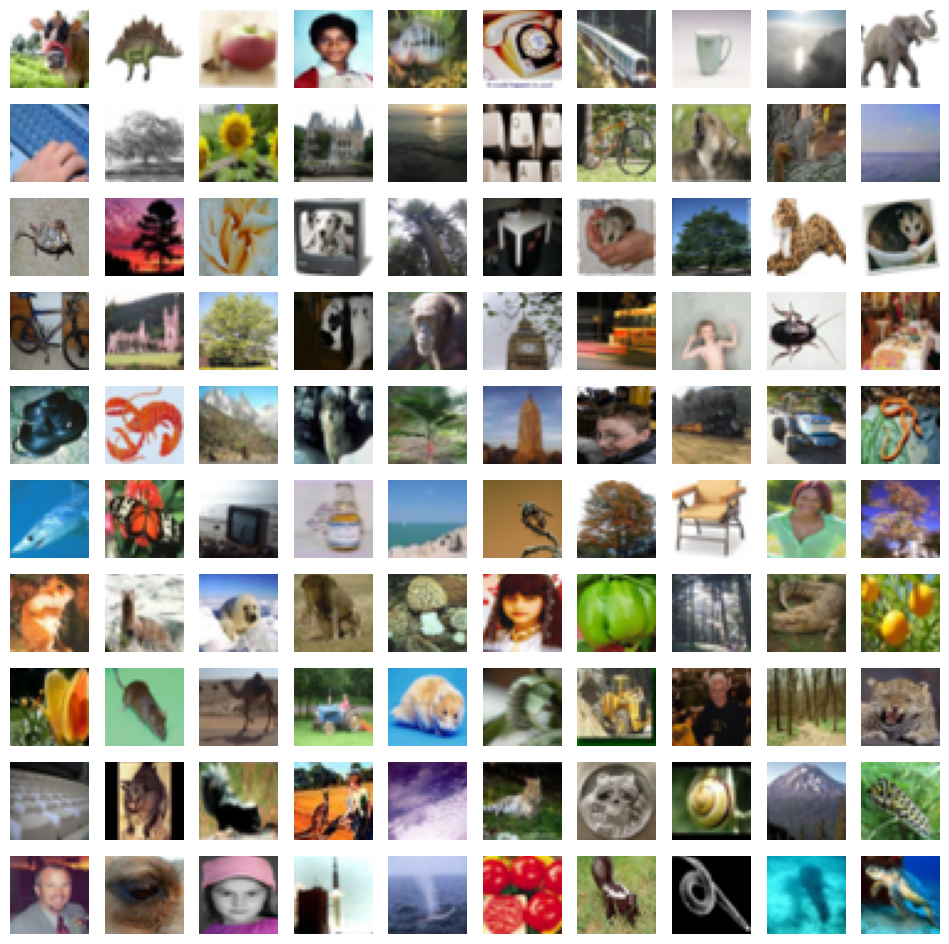

In [14]:
plt.figure(figsize=(12,12))
for i in range(100):
  plt.subplot(10,10,1+i)
  plt.axis('off')
  plt.imshow(X_train[i],cmap='gray')

### Splitting the train data again - we use the val set as test set and previous test set for final predictions

In [15]:
# I only noticed that this didn't have a seed set AFTER the above CIFAR10 model was trained and frozen
# Since those were all trained on the same split, I'm leaving the seed off of those.
# But going forward all train_test_splits will use the same seed.
x_train,x_val,y_train,y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state=42)

###  Defining the classes

In [16]:
classes = [
    'apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 'bicycle', 'bottle',
    'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel', 'can', 'castle', 'caterpillar', 'cattle',
    'chair', 'chimpanzee', 'clock', 'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur',
    'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 'house', 'kangaroo', 'computer_keyboard',
    'lamp', 'lawn_mower', 'leopard', 'lion', 'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain',
    'mouse', 'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear', 'pickup_truck', 'pine_tree',
    'plain', 'plate', 'poppy', 'porcupine', 'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket',
    'rose', 'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake', 'spider',
    'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table', 'tank', 'telephone', 'television', 'tiger', 'tractor',
    'train', 'trout', 'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman', 'worm'
]

In [17]:
y_train = to_categorical(y_train, num_classes = 100)
y_val = to_categorical(y_val, num_classes = 100)
#y_test = to_categorical(Y_test, num_classes = 10) # As far as I can tell, y_test was never actually used so I'm leaving it commented out

In [18]:
x_train = x_train * 1.0/255
x_val = x_val * 1.0/255
X_test = X_test * 1.0/255

In [19]:
print(x_train.shape, x_val.shape, X_test.shape)
print(y_train.shape, y_val.shape, Y_test.shape)

(40000, 32, 32, 3) (10000, 32, 32, 3) (10000, 32, 32, 3)
(40000, 100) (10000, 100) (10000, 1)


###  Image Data Augmentation

In [20]:
train_datagen = ImageDataGenerator(
        rotation_range = 10,
        zoom_range = 0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.1,
        horizontal_flip = True,
        vertical_flip = False
        )
train_datagen.fit(x_train)

###  Reduce Learning Rate if accuracy is not improving for 3 epochs

In [21]:
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    factor=0.6,
    min_lr=1e-6)

### Load the Saved CNN Model

In [22]:
cnn_model = load_model('./custom_cnn.keras')
cnn_model.layers

I0000 00:00:1733537150.482710    3518 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>,
 <Dense name=dense_72, built=True>,
 <BatchNormalization name=batch_normalization_88, built=True>,
 <Dropout name=dropout_48, built=True>,
 <Dense name=dense_73, built=True>,
 <BatchNormalization name=batch_normalization_89, built=True>,
 <Dropout name=dropout_49, built=True>,
 <Dense name=dense_74, built=True>]

### Remove the Dense Layers

In [23]:
# There is 100% a more graceful way to do this but I'm paranoid AND lazy
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>]

### Freeze the Model

In [24]:
for layers in cnn_model.layers:
    layers.trainable = False

In [25]:
cnn_model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 794,006 (3.03 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 130,432 (509.50 KB)

 Optimizer params: 663,574 (2.53 MB)

### Building the CNN

In [26]:
model = tf.keras.models.Sequential()

model.add(Input((32, 32, 3)))
model.add(cnn_model)
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(100, activation='softmax'))

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        25,700 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 356,580 (1.36 MB)

 Trainable params: 224,612 (877.39 KB)

 Non-trainable params: 131,968 (515.50 KB)

### Define the Optimizer

In [27]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

### Compile the model

In [28]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [29]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


/home/mist861/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733537166.206638    4659 service.cc:148] XLA service 0x7f72a000a270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733537166.208381    4659 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 Laptop GPU, Compute Capability 8.9
2024-12-06 20:06:06.237746: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733537166.355709    4659 cuda_dnn.cc:529] Loaded cuDNN version 90300
2024-12-06 20:06:07.320607: I external/l

 16/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.0169 - loss: 5.1695     

I0000 00:00:1733537168.784269    4659 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


625/625 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - accuracy: 0.1785 - loss: 3.6176 - val_accuracy: 0.3159 - val_loss: 2.7649 - learning_rate: 0.0010
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.3141 - loss: 2.6894 - val_accuracy: 0.3471 - val_loss: 2.6147 - learning_rate: 0.0010
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.3525 - loss: 2.5157 - val_accuracy: 0.3599 - val_loss: 2.5255 - learning_rate: 0.0010
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.3650 - loss: 2.4429 - val_accuracy: 0.3705 - val_loss: 2.4967 - learning_rate: 0.0010
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.3761 - loss: 2.3748 - val_accuracy: 0.3737 - val_loss: 2.4658 - learning_rate: 0.0010
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.3877 - loss: 2.3342 - val_accuracy: 0.3830 - val_loss: 2.4386 - learning_rate: 0.0010
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.3980 - loss: 2.2890 - val

In [30]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        25,700 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 805,806 (3.07 MB)

 Trainable params: 224,612 (877.39 KB)

 Non-trainable params: 131,968 (515.50 KB)

 Optimizer params: 449,226 (1.71 MB)

### Accuracy and Loss

{'accuracy': [0.23857499659061432, 0.32192501425743103, 0.34790000319480896, 0.36230000853538513, 0.37507501244544983, 0.3868499994277954, 0.3962250053882599, 0.39777499437332153, 0.4047999978065491, 0.415149986743927, 0.41952499747276306, 0.4232499897480011, 0.4302999973297119, 0.44780001044273376, 0.45407500863075256, 0.46129998564720154, 0.4631499946117401, 0.46482500433921814, 0.4674749970436096, 0.4768750071525574, 0.4817250072956085, 0.4880250096321106, 0.49322500824928284, 0.4913249909877777, 0.4944249987602234, 0.49559998512268066, 0.5050250291824341, 0.5047000050544739, 0.5100250244140625, 0.5131499767303467], 'loss': [3.1695973873138428, 2.6617839336395264, 2.5321550369262695, 2.4530045986175537, 2.395390272140503, 2.3444125652313232, 2.305837392807007, 2.2692599296569824, 2.2401278018951416, 2.2110161781311035, 2.1816282272338867, 2.167001485824585, 2.1380937099456787, 2.053696632385254, 2.023604393005371, 2.007812976837158, 1.9891510009765625, 1.9718972444534302, 1.96381485

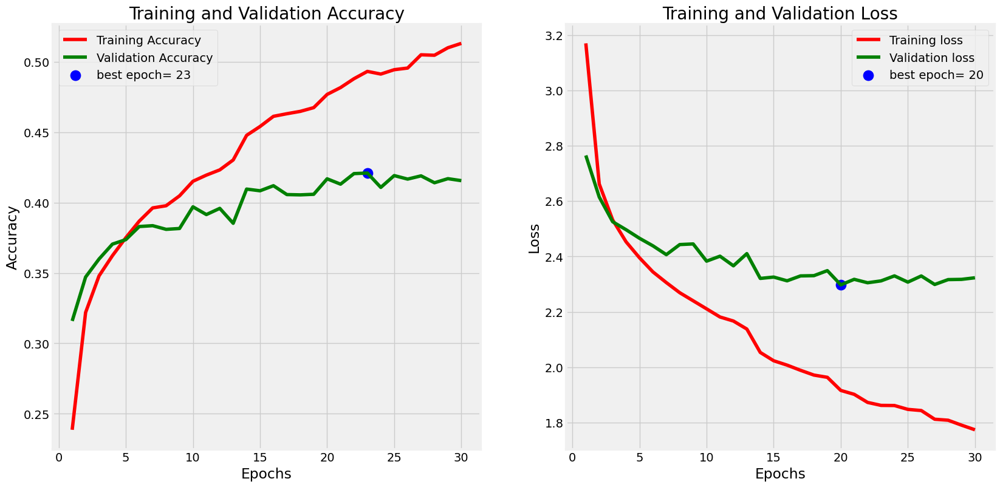

In [31]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.4282


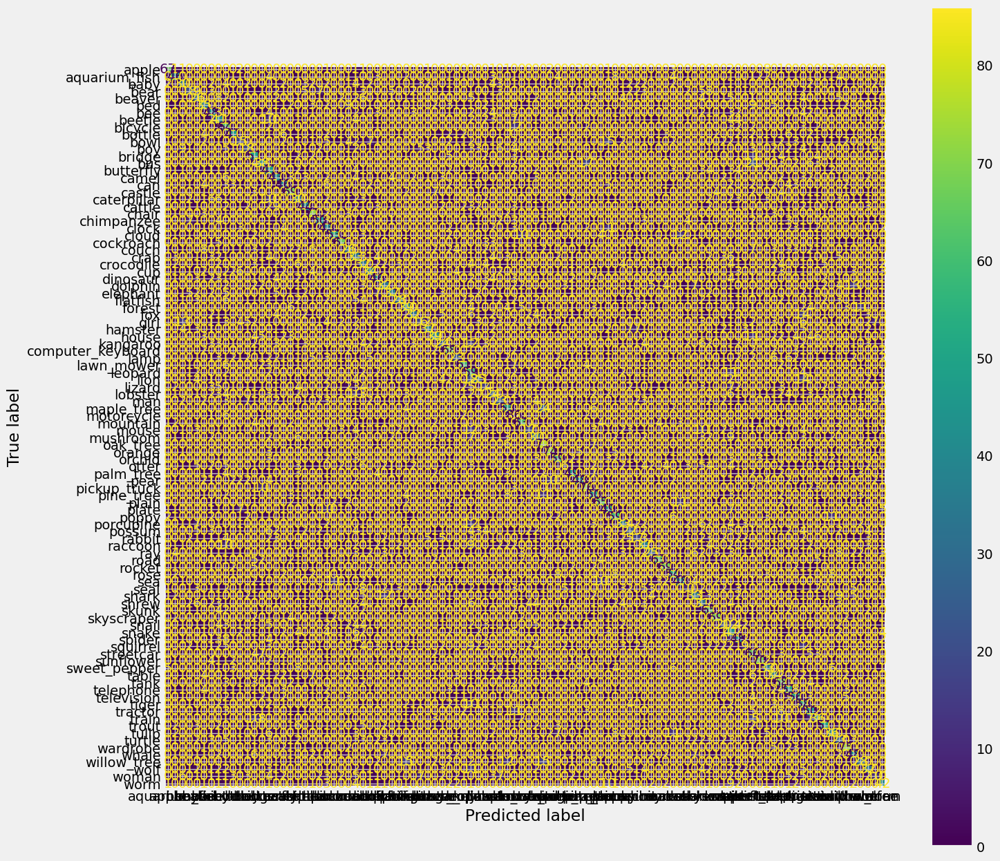

In [32]:
plot_testing(model, classes, X_test, Y_test)

# Custom CNN (Tiny ImageNet FROZEN/TRANSFER-LEARNING)

## Prework

In [326]:
!pip install imageio

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.4/315.4 KB 4.4 MB/s eta 0:00:00a 0:00:01


### Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from datetime import datetime
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, UpSampling2D, Dropout, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Resizing
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import load_model
import time
from imageio import imread

/home/mist861/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2024-12-06 21:21:32.410162: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-06 21:21:32.532329: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733541692.581101   29590 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory

In [8]:
# Double-check that CUDA is working
tf.test.is_gpu_available()

I0000 00:00:1733511669.692900    5096 gpu_device.cc:2022] Created device /device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


True

### Define Methods

In [2]:
def plot_training(hist):

    # Print the exact metrics
    print(hist.history)

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

### Importing the Tiny ImageNet Dataset

In [320]:
! git clone https://github.com/seshuad/IMagenet
! ls 'IMagenet/tiny-imagenet-200/'

Cloning into 'IMagenet'...
remote: Enumerating objects: 120594, done.
remote: Total 120594 (delta 0), reused 0 (delta 0), pack-reused 120594 (from 1)
Receiving objects: 100% (120594/120594), 212.68 MiB | 52.85 MiB/s, done.
Resolving deltas: 100% (1115/1115), done.
Updating files: 100% (120206/120206), done.
test  train  val  wnids.txt  words.txt


In [4]:
path = 'IMagenet/tiny-imagenet-200/'

def get_id_dictionary():
    id_dict = {}
    for i, line in enumerate(open( path + 'wnids.txt', 'r')):
        id_dict[line.replace('\n', '')] = i
    return id_dict
  
def get_class_to_id_dict():
    id_dict = get_id_dictionary()
    all_classes = {}
    result = {}
    for i, line in enumerate(open( path + 'words.txt', 'r')):
        n_id, word = line.split('\t')[:2]
        all_classes[n_id] = word
    for key, value in id_dict.items():
        result[value] = (key, all_classes[key])      
    return result

def get_data(id_dict):
    print('starting loading data')
    train_data, test_data = [], []
    train_labels, test_labels = [], []
    t = time.time()
    for key, value in id_dict.items():
        train_data += [imread( path + 'train/{}/images/{}_{}.JPEG'.format(key, key, str(i)), mode='RGB') for i in range(500)]
        train_labels_ = np.array([[0]*200]*500)
        train_labels_[:, value] = 1
        train_labels += train_labels_.tolist()

    for line in open( path + 'val/val_annotations.txt'):
        img_name, class_id = line.split('\t')[:2]
        test_data.append(imread( path + 'val/images/{}'.format(img_name) ,mode='RGB'))
        test_labels_ = np.array([[0]*200])
        test_labels_[0, id_dict[class_id]] = 1
        test_labels += test_labels_.tolist()

    print('finished loading data, in {} seconds'.format(time.time() - t))
    return np.array(train_data), np.array(train_labels), np.array(test_data), np.array(test_labels)
  
train_data, train_labels, test_data, test_labels = get_data(get_id_dictionary())

print( "train data shape: ",  train_data.shape )
print( "train label shape: ", train_labels.shape )
print( "test data shape: ",   test_data.shape )
print( "test_labels.shape: ", test_labels.shape )

starting loading data


/tmp/ipykernel_29590/1122810378.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  train_data += [imread( path + 'train/{}/images/{}_{}.JPEG'.format(key, key, str(i)), mode='RGB') for i in range(500)]
/tmp/ipykernel_29590/1122810378.py:33: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  test_data.append(imread( path + 'val/images/{}'.format(img_name) ,mode='RGB'))


finished loading data, in 44.16159224510193 seconds
train data shape:  (100000, 64, 64, 3)
train label shape:  (100000, 200)
test data shape:  (10000, 64, 64, 3)
test_labels.shape:  (10000, 200)


In [5]:
def shuffle_data(train_data, train_labels ):
    size = len(train_data)
    train_idx = np.arange(size)
    np.random.shuffle(train_idx)

    return train_data[train_idx], train_labels[train_idx]
  
train_data, train_labels = shuffle_data(train_data, train_labels)

###  Plotting some images from the dataset

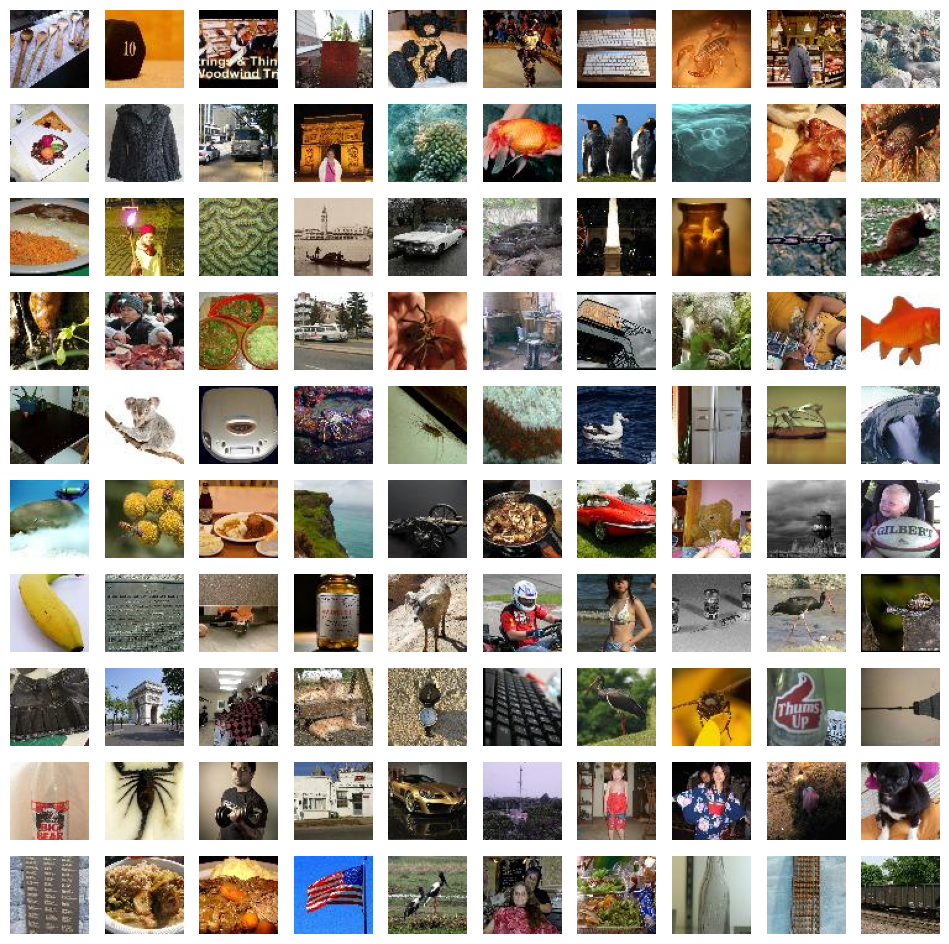

In [6]:
plt.figure(figsize=(12,12))
for i in range(100):
  plt.subplot(10,10,1+i)
  plt.axis('off')
  plt.imshow(train_data[i],cmap='gray')

### Splitting the train data again - we use the val set as test set and previous test set for final predictions

In [6]:
x_train,x_val,y_train,y_val = train_test_split(train_data, train_labels, test_size = 0.2, random_state=42)

###  Data Preprocessing

In [8]:
x_train = x_train.astype('float32')
x_val = x_val.astype('float32')
test_data = test_data.astype('float32')

x_train = x_train * 1.0/255
x_val = x_val * 1.0/255
test_data = test_data * 1.0/255

In [9]:
print(x_train.shape, x_val.shape, test_data.shape)
print(y_train.shape, y_val.shape, test_labels.shape)

(80000, 64, 64, 3) (20000, 64, 64, 3) (10000, 64, 64, 3)
(80000, 200) (20000, 200) (10000, 200)


###  Image Data Augmentation

In [10]:
train_datagen = ImageDataGenerator(
        rotation_range = 10,
        zoom_range = 0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.1,
        horizontal_flip = True,
        vertical_flip = False
        )
train_datagen.fit(x_train)

###  Reduce Learning Rate if accuracy is not improving for 3 epochs

In [11]:
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    factor=0.6,
    min_lr=1e-6)

### Load the Saved CNN Model

In [12]:
cnn_model = load_model('./custom_cnn.keras')
cnn_model.layers

I0000 00:00:1733541895.792159   29590 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>,
 <Dense name=dense_72, built=True>,
 <BatchNormalization name=batch_normalization_88, built=True>,
 <Dropout name=dropout_48, built=True>,
 <Dense name=dense_73, built=True>,
 <BatchNormalization name=batch_normalization_89, built=True>,
 <Dropout name=dropout_49, built=True>,
 <Dense name=dense_74, built=True>]

### Remove the Dense Layers

In [13]:
# There is 100% a more graceful way to do this but I'm paranoid AND lazy
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>]

### Freeze the Model

In [14]:
for layers in cnn_model.layers:
    layers.trainable = False

In [15]:
cnn_model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 794,006 (3.03 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 130,432 (509.50 KB)

 Optimizer params: 663,574 (2.53 MB)

### Building the CNN

In [20]:
model = tf.keras.models.Sequential()

model.add(Resizing(32, 32))
model.add(cnn_model)
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(200, activation='softmax'))

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 130,432 (509.50 KB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 130,432 (509.50 KB)

### Define the Optimizer

In [21]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

### Compile the model

In [22]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [23]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


I0000 00:00:1733542007.469653   31273 service.cc:148] XLA service 0x7f3fec0101f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733542007.471223   31273 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 Laptop GPU, Compute Capability 8.9
2024-12-06 21:26:47.502146: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733542007.624484   31273 cuda_dnn.cc:529] Loaded cuDNN version 90300
2024-12-06 21:26:48.625690: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1676', 120 bytes spill stores, 120 bytes spill loads

2024-12-06 21:26:48.662118: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_16

   7/1250 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - accuracy: 0.0036 - loss: 5.8169      

I0000 00:00:1733542010.094071   31273 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1250/1250 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - accuracy: 0.0955 - loss: 4.5072 - val_accuracy: 0.1751 - val_loss: 3.7892 - learning_rate: 0.0010
Epoch 2/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.1749 - loss: 3.7893 - val_accuracy: 0.1968 - val_loss: 3.6740 - learning_rate: 0.0010
Epoch 3/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.1920 - loss: 3.6523 - val_accuracy: 0.2061 - val_loss: 3.6202 - learning_rate: 0.0010
Epoch 4/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.2042 - loss: 3.5920 - val_accuracy: 0.2076 - val_loss: 3.5834 - learning_rate: 0.0010
Epoch 5/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.2116 - loss: 3.5367 - val_accuracy: 0.2131 - val_loss: 3.5799 - learning_rate: 0.0010
Epoch 6/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.2192 - loss: 3.4964 - val_accuracy: 0.2129 - val_loss: 3.5815 - learning_rate: 0.0010
Epoch 7/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - accuracy: 0.2217 

In [24]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 200)            │        51,400 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 882,906 (3.37 MB)

 Trainable params: 250,312 (977.78 KB)

 Non-trainable params: 131,968 (515.50 KB)

 Optimizer params: 500,626 (1.91 MB)

### Accuracy and Loss

{'accuracy': [0.1279750019311905, 0.17611250281333923, 0.19302499294281006, 0.20287500321865082, 0.21170000731945038, 0.21511250734329224, 0.22066250443458557, 0.22562499344348907, 0.22955000400543213, 0.23250000178813934, 0.23502500355243683, 0.24142499268054962, 0.24457499384880066, 0.24726249277591705, 0.24747499823570251, 0.25029999017715454, 0.2518250048160553, 0.25612500309944153, 0.2560875117778778, 0.2680250108242035, 0.26957499980926514, 0.2722625136375427, 0.274212509393692, 0.27621251344680786, 0.2828125059604645, 0.2842625081539154, 0.2835874855518341, 0.28760001063346863, 0.2887749969959259, 0.2875874936580658], 'loss': [4.167820930480957, 3.7739179134368896, 3.6631882190704346, 3.602705478668213, 3.555189847946167, 3.5202198028564453, 3.4870545864105225, 3.460618734359741, 3.43459415435791, 3.4093308448791504, 3.398447275161743, 3.3696587085723877, 3.3467514514923096, 3.340644598007202, 3.3290023803710938, 3.3099706172943115, 3.3000195026397705, 3.2841742038726807, 3.2711

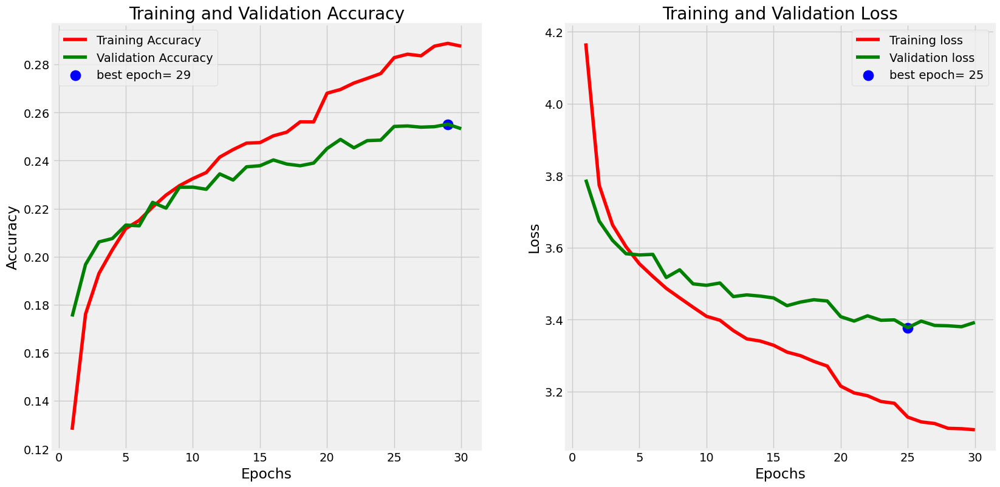

In [25]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

In [42]:
y_pred = np.argmax(model.predict(test_data), axis=-1)
y_true = np.argmax(test_labels, axis=-1) # Because we're NOT one-hot encoding here
print("Testing Accuracy: ", accuracy_score(y_true,y_pred))

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Testing Accuracy:  0.2434


# Custom CNN (Tiny ImageNet UNFROZEN/FINE-TUNING)

## Prework

In [326]:
!pip install imageio

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.4/315.4 KB 4.4 MB/s eta 0:00:00a 0:00:01


### Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from datetime import datetime
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, UpSampling2D, Dropout, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Resizing
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import load_model
import time
from imageio import imread

/home/mist861/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2024-12-08 10:43:20.831403: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-08 10:43:20.839403: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1733676200.848131   19142 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory

In [2]:
# Double-check that CUDA is working
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


I0000 00:00:1733676202.831608   19142 gpu_device.cc:2022] Created device /device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


True

### Define Methods

In [4]:
def plot_training(hist):

    # Print the exact metrics
    print(hist.history)

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

### Importing the Tiny ImageNet Dataset

In [320]:
! git clone https://github.com/seshuad/IMagenet
! ls 'IMagenet/tiny-imagenet-200/'

Cloning into 'IMagenet'...
remote: Enumerating objects: 120594, done.
remote: Total 120594 (delta 0), reused 0 (delta 0), pack-reused 120594 (from 1)
Receiving objects: 100% (120594/120594), 212.68 MiB | 52.85 MiB/s, done.
Resolving deltas: 100% (1115/1115), done.
Updating files: 100% (120206/120206), done.
test  train  val  wnids.txt  words.txt


In [5]:
path = 'IMagenet/tiny-imagenet-200/'

def get_id_dictionary():
    id_dict = {}
    for i, line in enumerate(open( path + 'wnids.txt', 'r')):
        id_dict[line.replace('\n', '')] = i
    return id_dict
  
def get_class_to_id_dict():
    id_dict = get_id_dictionary()
    all_classes = {}
    result = {}
    for i, line in enumerate(open( path + 'words.txt', 'r')):
        n_id, word = line.split('\t')[:2]
        all_classes[n_id] = word
    for key, value in id_dict.items():
        result[value] = (key, all_classes[key])      
    return result

def get_data(id_dict):
    print('starting loading data')
    train_data, test_data = [], []
    train_labels, test_labels = [], []
    t = time.time()
    for key, value in id_dict.items():
        train_data += [imread( path + 'train/{}/images/{}_{}.JPEG'.format(key, key, str(i)), mode='RGB') for i in range(500)]
        train_labels_ = np.array([[0]*200]*500)
        train_labels_[:, value] = 1
        train_labels += train_labels_.tolist()

    for line in open( path + 'val/val_annotations.txt'):
        img_name, class_id = line.split('\t')[:2]
        test_data.append(imread( path + 'val/images/{}'.format(img_name) ,mode='RGB'))
        test_labels_ = np.array([[0]*200])
        test_labels_[0, id_dict[class_id]] = 1
        test_labels += test_labels_.tolist()

    print('finished loading data, in {} seconds'.format(time.time() - t))
    return np.array(train_data), np.array(train_labels), np.array(test_data), np.array(test_labels)
  
train_data, train_labels, test_data, test_labels = get_data(get_id_dictionary())

print( "train data shape: ",  train_data.shape )
print( "train label shape: ", train_labels.shape )
print( "test data shape: ",   test_data.shape )
print( "test_labels.shape: ", test_labels.shape )

starting loading data


/tmp/ipykernel_19142/1122810378.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  train_data += [imread( path + 'train/{}/images/{}_{}.JPEG'.format(key, key, str(i)), mode='RGB') for i in range(500)]
/tmp/ipykernel_19142/1122810378.py:33: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  test_data.append(imread( path + 'val/images/{}'.format(img_name) ,mode='RGB'))


finished loading data, in 37.85199952125549 seconds
train data shape:  (100000, 64, 64, 3)
train label shape:  (100000, 200)
test data shape:  (10000, 64, 64, 3)
test_labels.shape:  (10000, 200)


In [6]:
def shuffle_data(train_data, train_labels ):
    size = len(train_data)
    train_idx = np.arange(size)
    np.random.shuffle(train_idx)

    return train_data[train_idx], train_labels[train_idx]
  
train_data, train_labels = shuffle_data(train_data, train_labels)

###  Plotting some images from the dataset

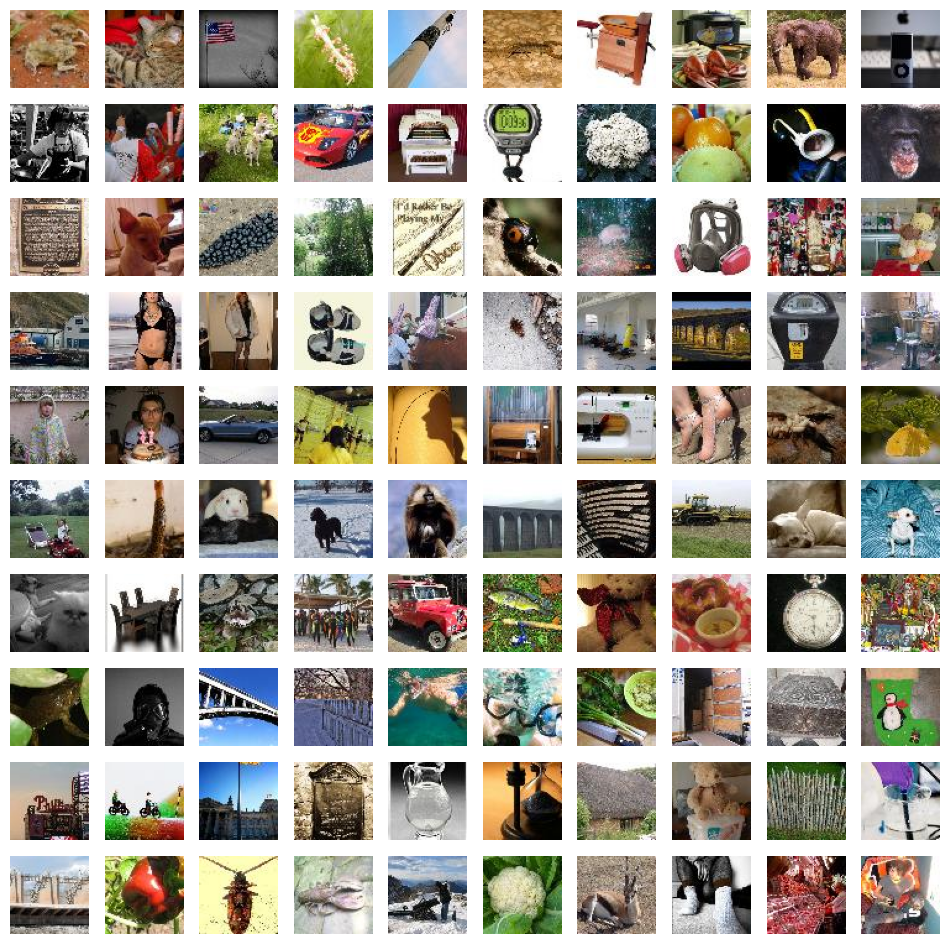

In [7]:
plt.figure(figsize=(12,12))
for i in range(100):
  plt.subplot(10,10,1+i)
  plt.axis('off')
  plt.imshow(train_data[i],cmap='gray')

### Splitting the train data again - we use the val set as test set and previous test set for final predictions

In [8]:
x_train,x_val,y_train,y_val = train_test_split(train_data, train_labels, test_size = 0.2, random_state=42)

###  Defining the classes

In [9]:
x_train = x_train.astype('float32')
x_val = x_val.astype('float32')
test_data = test_data.astype('float32')

x_train = x_train * 1.0/255
x_val = x_val * 1.0/255
test_data = test_data * 1.0/255

In [10]:
print(x_train.shape, x_val.shape, test_data.shape)
print(y_train.shape, y_val.shape, test_labels.shape)

(80000, 64, 64, 3) (20000, 64, 64, 3) (10000, 64, 64, 3)
(80000, 200) (20000, 200) (10000, 200)


###  Image Data Augmentation

In [11]:
train_datagen = ImageDataGenerator(
        rotation_range = 10,
        zoom_range = 0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.1,
        horizontal_flip = True,
        vertical_flip = False
        )
train_datagen.fit(x_train)

###  Reduce Learning Rate if accuracy is not improving for 3 epochs

In [12]:
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    factor=0.6,
    min_lr=1e-6)

## Remove ALL Dense Layers

### Load the Saved CNN Model

In [42]:
cnn_model = load_model('./custom_cnn.keras')
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>,
 <Dense name=dense_72, built=True>,
 <BatchNormalization name=batch_normalization_88, built=True>,
 <Dropout name=dropout_48, built=True>,
 <Dense name=dense_73, built=True>,
 <BatchNormalization name=batch_normalization_89, built=True>,
 <Dropout name=dropout_49, built=True>,
 <Dense name=dense_74, built=True>]

## Remove the Dense Layers

In [43]:
# There is 100% a more graceful way to do this but I'm paranoid AND lazy
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>]

### Do NOT Freeze the Model

In [44]:
cnn_model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 794,006 (3.03 MB)

 Trainable params: 130,304 (509.00 KB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 663,574 (2.53 MB)

### Building the CNN

In [45]:
model = tf.keras.models.Sequential()

model.add(Resizing(32, 32))
model.add(cnn_model)
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(200, activation='softmax'))

model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_4 (Resizing)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 130,432 (509.50 KB)

 Trainable params: 130,304 (509.00 KB)

 Non-trainable params: 128 (512.00 B)

### Define the Optimizer

In [46]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

### Compile the model

In [47]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [48]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


/home/mist861/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1250/1250 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - accuracy: 0.0958 - loss: 4.4711 - val_accuracy: 0.1623 - val_loss: 3.9448 - learning_rate: 0.0010
Epoch 2/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2035 - loss: 3.5938 - val_accuracy: 0.2048 - val_loss: 3.6375 - learning_rate: 0.0010
Epoch 3/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2376 - loss: 3.3803 - val_accuracy: 0.2222 - val_loss: 3.5610 - learning_rate: 0.0010
Epoch 4/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2632 - loss: 3.2378 - val_accuracy: 0.2462 - val_loss: 3.3862 - learning_rate: 0.0010
Epoch 5/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2782 - loss: 3.1364 - val_accuracy: 0.2734 - val_loss: 3.1974 - learning_rate: 0.0010
Epoch 6/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2964 - loss: 3.0639 - val_accuracy: 0.2682 - val_loss: 3.2946 - learning_rate: 0.0010
Epoch 7/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.3050 

In [49]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_4 (Resizing)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 200)            │        51,400 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,514 (4.36 MB)

 Trainable params: 380,616 (1.45 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 761,234 (2.90 MB)

### Accuracy and Loss

{'accuracy': [0.1356624960899353, 0.2081499993801117, 0.23960000276565552, 0.26272499561309814, 0.2775624990463257, 0.2930375039577484, 0.3008125126361847, 0.3113124966621399, 0.3379000127315521, 0.3471750020980835, 0.35171249508857727, 0.3591249883174896, 0.3639500141143799, 0.36602500081062317, 0.3839874863624573, 0.3887749910354614, 0.39157500863075256, 0.3922874927520752, 0.39467498660087585, 0.3980500102043152, 0.4029250144958496, 0.4037874937057495, 0.4056749939918518, 0.40617498755455017, 0.4102250039577484, 0.4118250012397766, 0.423799991607666, 0.4261249899864197, 0.4291124939918518, 0.43152499198913574], 'loss': [4.091372489929199, 3.55676531791687, 3.3708581924438477, 3.2420811653137207, 3.1472244262695312, 3.0778656005859375, 3.0189461708068848, 2.9676120281219482, 2.8239917755126953, 2.778430700302124, 2.750093936920166, 2.7167294025421143, 2.6924784183502197, 2.6715614795684814, 2.5791306495666504, 2.549567461013794, 2.5429985523223877, 2.5319573879241943, 2.5100040435791

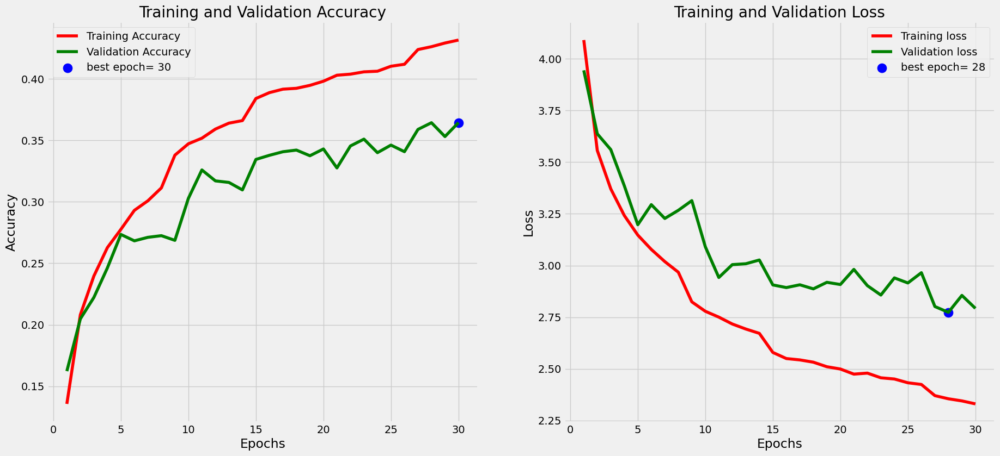

In [50]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

In [51]:
y_pred = np.argmax(model.predict(test_data), axis=-1)
y_true = np.argmax(test_labels, axis=-1) # Because we're NOT one-hot encoding here
print("Testing Accuracy: ", accuracy_score(y_true,y_pred))

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.3667


### Save the Model

In [52]:
model.save('./finetuned_cnn.keras')

## Remove JUST the Output Layer

### Load the Saved CNN Model

In [30]:
cnn_model = load_model('./custom_cnn.keras')
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>,
 <Dense name=dense_72, built=True>,
 <BatchNormalization name=batch_normalization_88, built=True>,
 <Dropout name=dropout_48, built=True>,
 <Dense name=dense_73, built=True>,
 <BatchNormalization name=batch_normalization_89, built=True>,
 <Dropout name=dropout_49, built=True>,
 <Dense name=dense_74, built=True>]

### Remove the Dense Layers

In [31]:
# We're removing JUST the very top layer, the output layer
cnn_model.pop()
cnn_model.layers

[<Conv2D name=conv2d_123, built=True>,
 <Conv2D name=conv2d_124, built=True>,
 <BatchNormalization name=batch_normalization_87, built=True>,
 <MaxPooling2D name=max_pooling2d_36, built=True>,
 <Conv2D name=conv2d_125, built=True>,
 <Conv2D name=conv2d_126, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling2d_4, built=True>,
 <Dense name=dense_72, built=True>,
 <BatchNormalization name=batch_normalization_88, built=True>,
 <Dropout name=dropout_48, built=True>,
 <Dense name=dense_73, built=True>,
 <BatchNormalization name=batch_normalization_89, built=True>,
 <Dropout name=dropout_49, built=True>]

### Do NOT Freeze the Model

In [32]:
cnn_model.summary()

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_123 (Conv2D)             │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_124 (Conv2D)             │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_87          │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_125 (Conv2D)             │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_126 (Conv2D)             │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_88          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_48 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_89          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_49 (Dropout)            │ (None, 256)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 994,454 (3.79 MB)

 Trainable params: 329,216 (1.26 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 663,574 (2.53 MB)

### Building the CNN

In [34]:
model = tf.keras.models.Sequential()

model.add(Resizing(32, 32))
model.add(cnn_model)
model.add(Dense(200, activation='softmax')) # Again, we're only adding a single layer

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_3 (Resizing)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 256)            │       330,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 330,880 (1.26 MB)

 Trainable params: 329,216 (1.26 MB)

 Non-trainable params: 1,664 (6.50 KB)

### Define the Optimizer

In [35]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001) # Lower the learning rate to account for most of the model already being trained

### Compile the model

In [36]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [37]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


/home/mist861/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1250/1250 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - accuracy: 0.0274 - loss: 5.1776 - val_accuracy: 0.1062 - val_loss: 4.3056 - learning_rate: 1.0000e-04
Epoch 2/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.1121 - loss: 4.2469 - val_accuracy: 0.1520 - val_loss: 3.9424 - learning_rate: 1.0000e-04
Epoch 3/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.1521 - loss: 3.9309 - val_accuracy: 0.1755 - val_loss: 3.7742 - learning_rate: 1.0000e-04
Epoch 4/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.1770 - loss: 3.7559 - val_accuracy: 0.1948 - val_loss: 3.6589 - learning_rate: 1.0000e-04
Epoch 5/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.1920 - loss: 3.6404 - val_accuracy: 0.2079 - val_loss: 3.5776 - learning_rate: 1.0000e-04
Epoch 6/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - accuracy: 0.2070 - loss: 3.5654 - val_accuracy: 0.2185 - val_loss: 3.5047 - learning_rate: 1.0000e-04
Epoch 7/30
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/

In [38]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_3 (Resizing)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 256)            │       330,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 200)            │        51,400 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,143,514 (4.36 MB)

 Trainable params: 380,616 (1.45 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 761,234 (2.90 MB)

### Accuracy and Loss

{'accuracy': [0.05112500116229057, 0.12212499976158142, 0.1564749926328659, 0.18078750371932983, 0.1953125, 0.2094375044107437, 0.22207500040531158, 0.22932499647140503, 0.23596249520778656, 0.24591250717639923, 0.25187501311302185, 0.25901249051094055, 0.264537513256073, 0.27008751034736633, 0.2735249996185303, 0.2826625108718872, 0.282987505197525, 0.2890374958515167, 0.2942250072956085, 0.29760000109672546, 0.3004625141620636, 0.3042375147342682, 0.3086875081062317, 0.3126375079154968, 0.31351250410079956, 0.31738749146461487, 0.32222500443458557, 0.3267750144004822, 0.3283750116825104, 0.32981249690055847], 'loss': [4.842641830444336, 4.155052661895752, 3.8918707370758057, 3.7364377975463867, 3.6323413848876953, 3.550330877304077, 3.4801902770996094, 3.4268136024475098, 3.38047456741333, 3.3325324058532715, 3.298370361328125, 3.259502649307251, 3.227032423019409, 3.19496750831604, 3.17280650138855, 3.139341115951538, 3.1144399642944336, 3.0918941497802734, 3.0667061805725098, 3.044

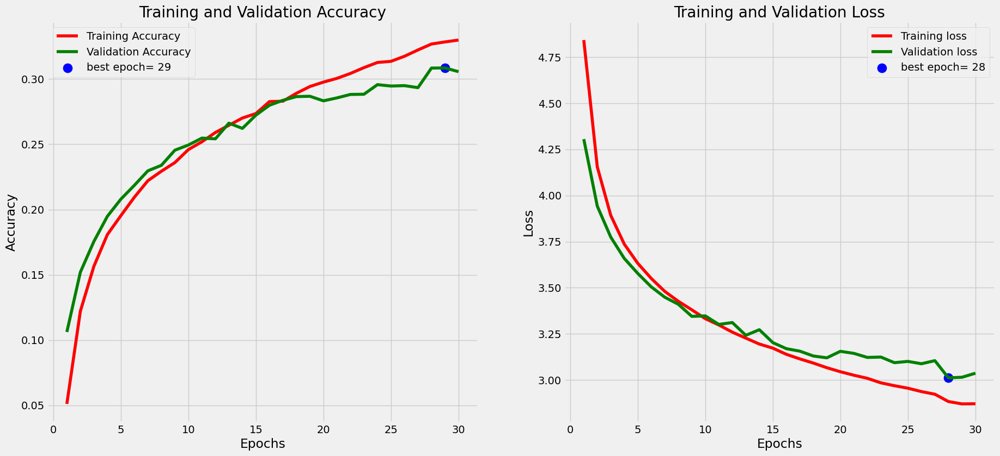

In [39]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

In [40]:
y_pred = np.argmax(model.predict(test_data), axis=-1)
y_true = np.argmax(test_labels, axis=-1) # Because we're NOT one-hot encoding here
print("Testing Accuracy: ", accuracy_score(y_true,y_pred))

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.311


### Save the Model

In [41]:
model.save('./finetuned_cnn_output-only.keras')

# Custom CNN (CIFAR10 FROZEN/Tiny ImageNet FINE-TUNED)

## Prework

### Install Packages

In [4]:
!pip install numpy matplotlib seaborn tensorflow[and-cuda] keras scikit-learn -U

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 71.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 82.2 MB/s eta 0:00:00a 0:00:01m
  Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
  Using cached tensorflow-2.18.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (615.3 MB)
  Using cached keras-3.7.0-py3-none-any.whl (1.2 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 82.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 KB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 73.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 72.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 88.3 MB/s eta 0:00:00ta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 73.4 MB/s eta 0:00:0000:01:00:01
     ━━━━━

### Importing Libraries

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from datetime import datetime
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, UpSampling2D, Dropout, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D, Resizing
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

In [8]:
# Double-check that CUDA is working
tf.test.is_gpu_available()

I0000 00:00:1733511669.692900    5096 gpu_device.cc:2022] Created device /device:GPU:0 with 9511 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


True

### Define Methods

In [54]:
def plot_training(hist):

    # Print the exact metrics
    print(hist.history)

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

In [55]:
def plot_testing(model, classes, x, y):
    y_pred = np.argmax(model.predict(x), axis=-1)
    y_true = y.ravel()
    print("Testing Accuracy: ", accuracy_score(y_true,y_pred))
    cm = confusion_matrix(y_true,y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    fig, ax = plt.subplots(figsize=(15,15))
    disp.plot(ax=ax)
    plt.show()

### Importing the Cifar 10 Dataset

In [56]:
cifar10 = tf.keras.datasets.cifar10
(X_train, Y_train), (X_test,Y_test) = cifar10.load_data()

###  Plotting some images from the dataset

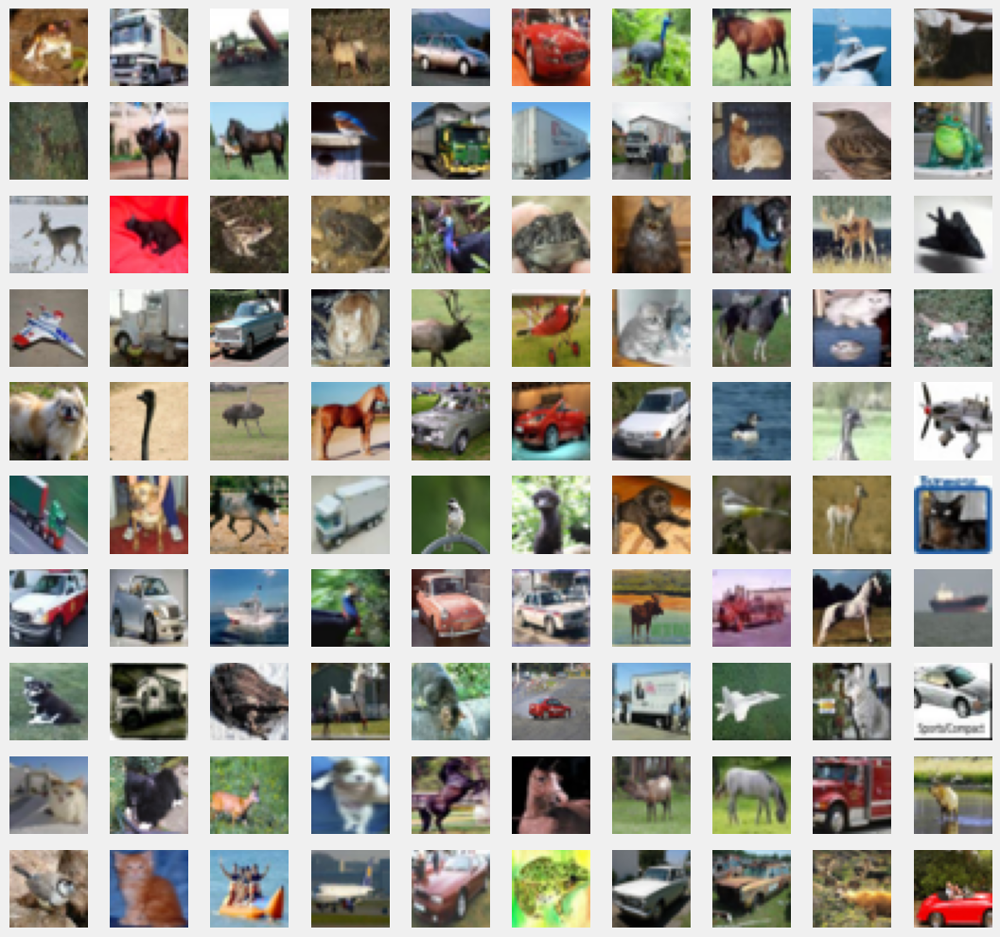

In [57]:
plt.figure(figsize=(12,12))
for i in range(100):
  plt.subplot(10,10,1+i)
  plt.axis('off')
  plt.imshow(X_train[i],cmap='gray')

### Splitting the train data again - we use the val set as test set and previous test set for final predictions

In [58]:
x_train,x_val,y_train,y_val = train_test_split(X_train, Y_train, test_size = 0.2)

###  Defining the classes

In [59]:
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ships', 'truck']

In [60]:
y_train = to_categorical(y_train, num_classes = 10)
y_val = to_categorical(y_val, num_classes = 10)
#y_test = to_categorical(Y_test, num_classes = 10)

In [61]:
x_train = x_train * 1.0/255
x_val = x_val * 1.0/255
X_test = X_test * 1.0/255

In [63]:
print(x_train.shape, x_val.shape, X_test.shape)
print(y_train.shape, y_val.shape, Y_test.shape)

(40000, 32, 32, 3) (10000, 32, 32, 3) (10000, 32, 32, 3)
(40000, 10) (10000, 10) (10000, 1)


###  Image Data Augmentation

In [64]:
train_datagen = ImageDataGenerator(
        rotation_range = 10,
        zoom_range = 0.1,
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.1,
        horizontal_flip = True,
        vertical_flip = False
        )
train_datagen.fit(x_train)

###  Reduce Learning Rate if accuracy is not improving for 3 epochs

In [65]:
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    factor=0.6,
    min_lr=1e-6)

## Fine-Tuned Model w/ ALL Dense Layers Removed

### Load the Saved CNN Model

In [66]:
cnn_model = load_model('./finetuned_cnn.keras')
cnn_model.layers

/home/mist861/.local/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 22 variables whereas the saved optimizer has 42 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


[<Resizing name=resizing_4, built=True>,
 <Sequential name=sequential_39, built=True>,
 <Dense name=dense_8, built=True>,
 <BatchNormalization name=batch_normalization_4, built=True>,
 <Dropout name=dropout_4, built=True>,
 <Dense name=dense_9, built=True>,
 <BatchNormalization name=batch_normalization_5, built=True>,
 <Dropout name=dropout_5, built=True>,
 <Dense name=dense_10, built=True>]

### Remove the Dense Layers

In [67]:
# There is 100% a more graceful way to do this but I'm paranoid AND lazy
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.pop()
cnn_model.layers

[<Resizing name=resizing_4, built=True>,
 <Sequential name=sequential_39, built=True>]

### Freeze the Model

In [68]:
for layers in cnn_model.layers:
    layers.trainable = False

In [69]:
cnn_model.summary() # Note that this looks different because we saved a model that was already saved as "one layer", so instead of showing all layers it just shows the one 

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_4 (Resizing)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 128)            │       130,432 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 891,666 (3.40 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 130,432 (509.50 KB)

 Optimizer params: 761,234 (2.90 MB)

### Building the CNN

In [80]:
model = tf.keras.models.Sequential()
model.add(cnn_model)
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.1))
model.add(Dense(10, activation='softmax'))

model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_4 (Sequential)       │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,450 (1.27 MB)

 Trainable params: 201,482 (787.04 KB)

 Non-trainable params: 131,968 (515.50 KB)

### Stochastic gradient descent optimizer with momentum.

In [81]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

Compile the model

In [82]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

### Test the Loaded Model on the Test Dataset WITHOUT Training

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.0683


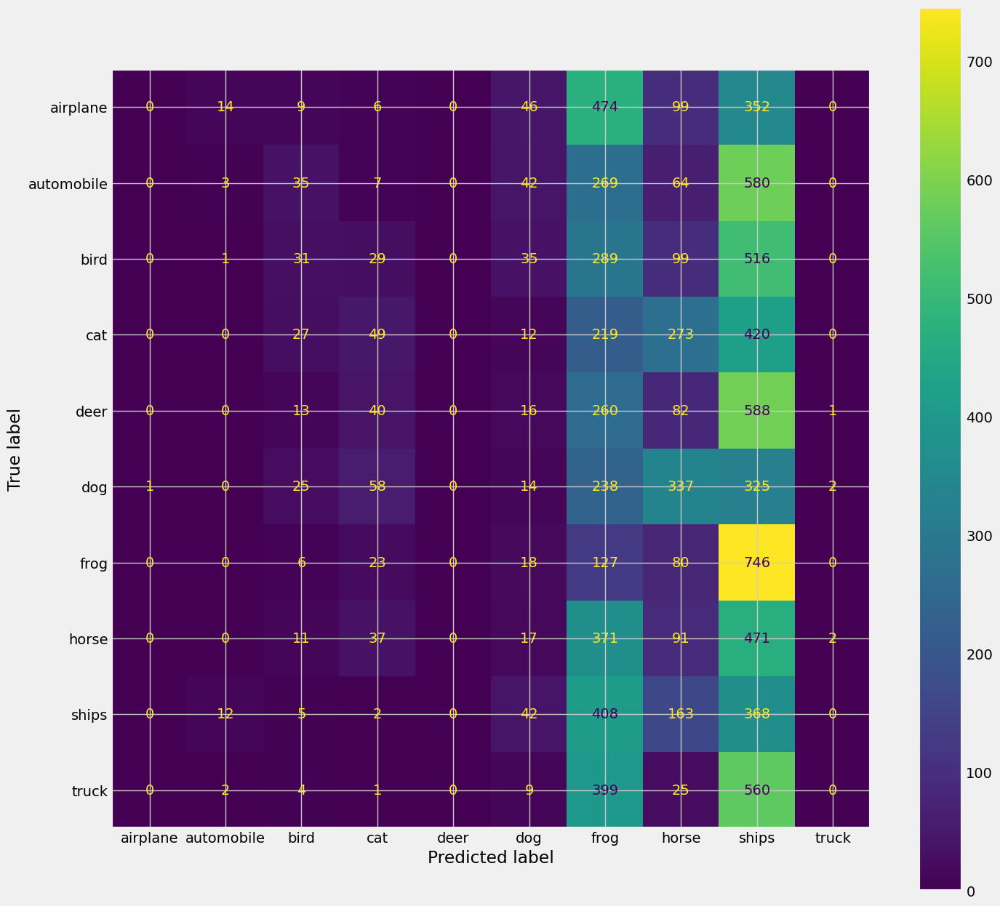

In [84]:
plot_testing(model, classes, X_test, Y_test)

### Retrain the Dense Layers for CIFAR10

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [86]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


/home/mist861/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


625/625 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - accuracy: 0.6102 - loss: 1.1587 - val_accuracy: 0.7290 - val_loss: 0.8268 - learning_rate: 0.0010
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7092 - loss: 0.8171 - val_accuracy: 0.7496 - val_loss: 0.7343 - learning_rate: 0.0010
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7306 - loss: 0.7648 - val_accuracy: 0.7512 - val_loss: 0.7139 - learning_rate: 0.0010
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7387 - loss: 0.7384 - val_accuracy: 0.7504 - val_loss: 0.7159 - learning_rate: 0.0010
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7469 - loss: 0.7066 - val_accuracy: 0.7515 - val_loss: 0.7153 - learning_rate: 0.0010
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7537 - loss: 0.7031 - val_accuracy: 0.7678 - val_loss: 0.6649 - learning_rate: 0.0010
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.7533 - loss: 0.6950 - val

In [87]:
model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_4 (Sequential)       │ (None, 128)            │       130,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 736,416 (2.81 MB)

 Trainable params: 201,482 (787.04 KB)

 Non-trainable params: 131,968 (515.50 KB)

 Optimizer params: 402,966 (1.54 MB)

### Accuracy and Loss

{'accuracy': [0.6673250198364258, 0.71670001745224, 0.7325249910354614, 0.7366750240325928, 0.7437000274658203, 0.7511749863624573, 0.7517499923706055, 0.7590749859809875, 0.7578499913215637, 0.7716500163078308, 0.7766000032424927, 0.7782750129699707, 0.7821999788284302, 0.7844750285148621, 0.7831000089645386, 0.7893750071525574, 0.7964249849319458, 0.7982500195503235, 0.8029249906539917, 0.8032749891281128, 0.8053500056266785, 0.8095499873161316, 0.8123250007629395, 0.8112499713897705, 0.8114500045776367, 0.8141250014305115, 0.8165249824523926, 0.8170999884605408, 0.8220499753952026, 0.822825014591217], 'loss': [0.9636965990066528, 0.8018253445625305, 0.7600200176239014, 0.7425092458724976, 0.7190889120101929, 0.709662914276123, 0.7007771730422974, 0.6830922961235046, 0.6802307367324829, 0.6428334712982178, 0.6306502223014832, 0.6202687621116638, 0.6101028323173523, 0.6108437776565552, 0.6061270236968994, 0.5968559384346008, 0.5740695595741272, 0.565604031085968, 0.5579683780670166, 0

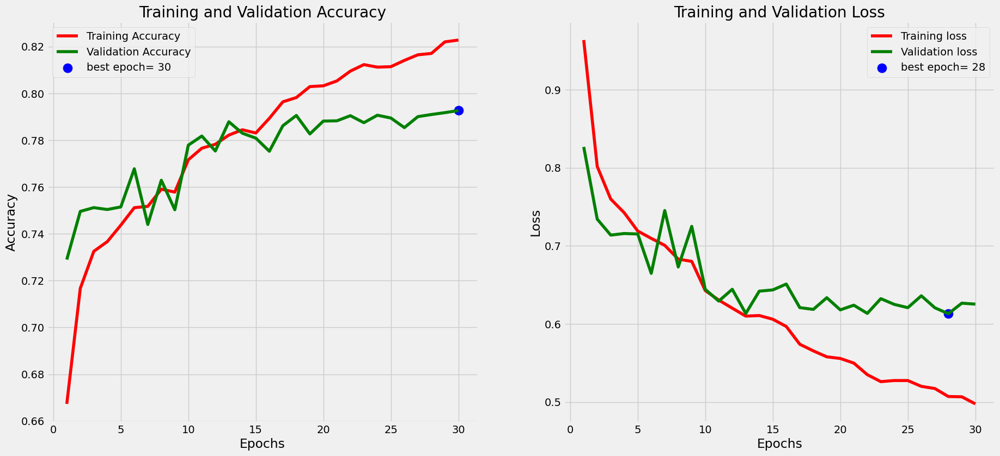

In [88]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step
Testing Accuracy:  0.7835


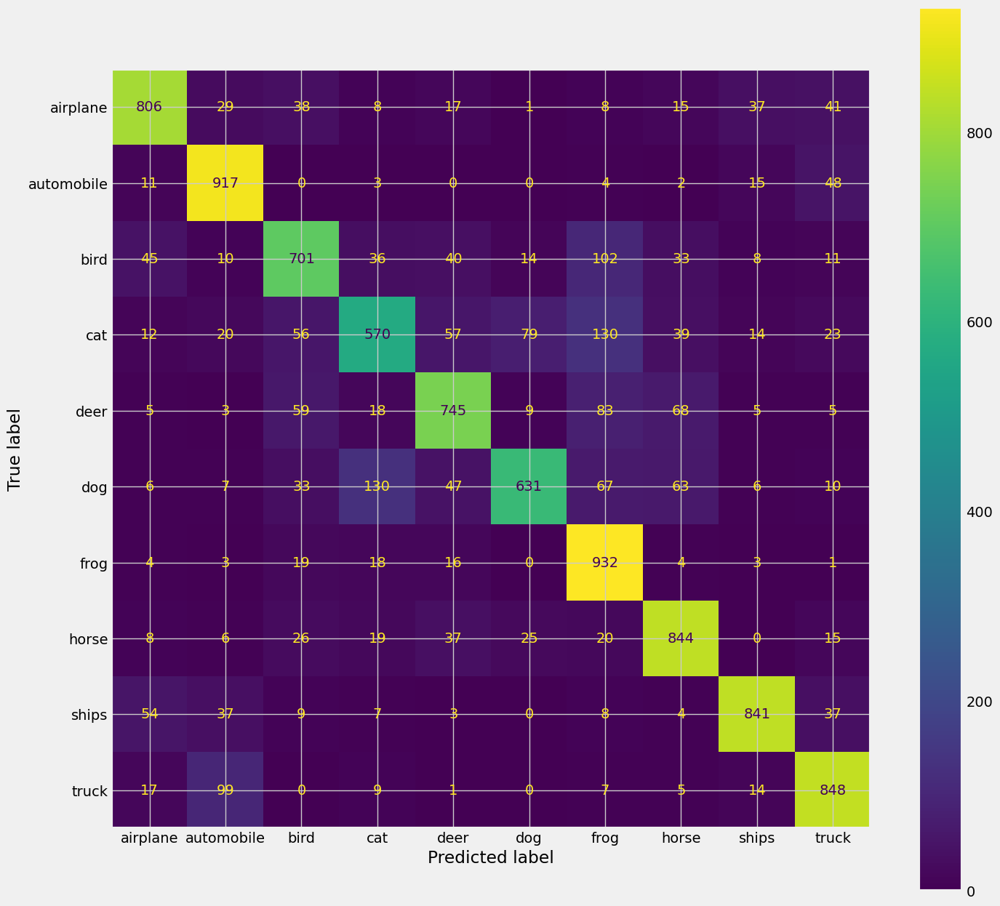

In [89]:
plot_testing(model, classes, X_test, Y_test)

## Fine-Tuned Model w/ ONLY the Output Layer Removed

### Load the Saved CNN Model

In [111]:
cnn_model = load_model('./finetuned_cnn_output-only.keras')
cnn_model.layers

/home/mist861/.local/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 42 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


[<Resizing name=resizing_3, built=True>,
 <Sequential name=sequential_39, built=True>,
 <Dense name=dense_7, built=True>]

### Remove the Dense Layers

In [112]:
# We're removing JUST the very top layer, the output layer
cnn_model.pop()
cnn_model.layers

[<Resizing name=resizing_3, built=True>,
 <Sequential name=sequential_39, built=True>]

### Freeze the Model

In [113]:
for layers in cnn_model.layers:
    layers.trainable = False

In [114]:
cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_3 (Resizing)           │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_39 (Sequential)      │ (None, 256)            │       330,880 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,092,114 (4.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 330,880 (1.26 MB)

 Optimizer params: 761,234 (2.90 MB)

### Building the CNN

In [115]:
model = tf.keras.models.Sequential()

model.add(cnn_model)
model.add(Dense(10, activation='softmax')) # Again, we're only adding a single layer

model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 256)            │       330,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,450 (1.27 MB)

 Trainable params: 2,570 (10.04 KB)

 Non-trainable params: 330,880 (1.26 MB)

### Define the Optimizer

In [116]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001) # Reduced learning rate to account for most of the dense layers still being trained

### Compile the model

In [117]:
model.compile(
    optimizer = optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

### Test the Loaded Model on the Test Dataset WITHOUT Training

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
Testing Accuracy:  0.134


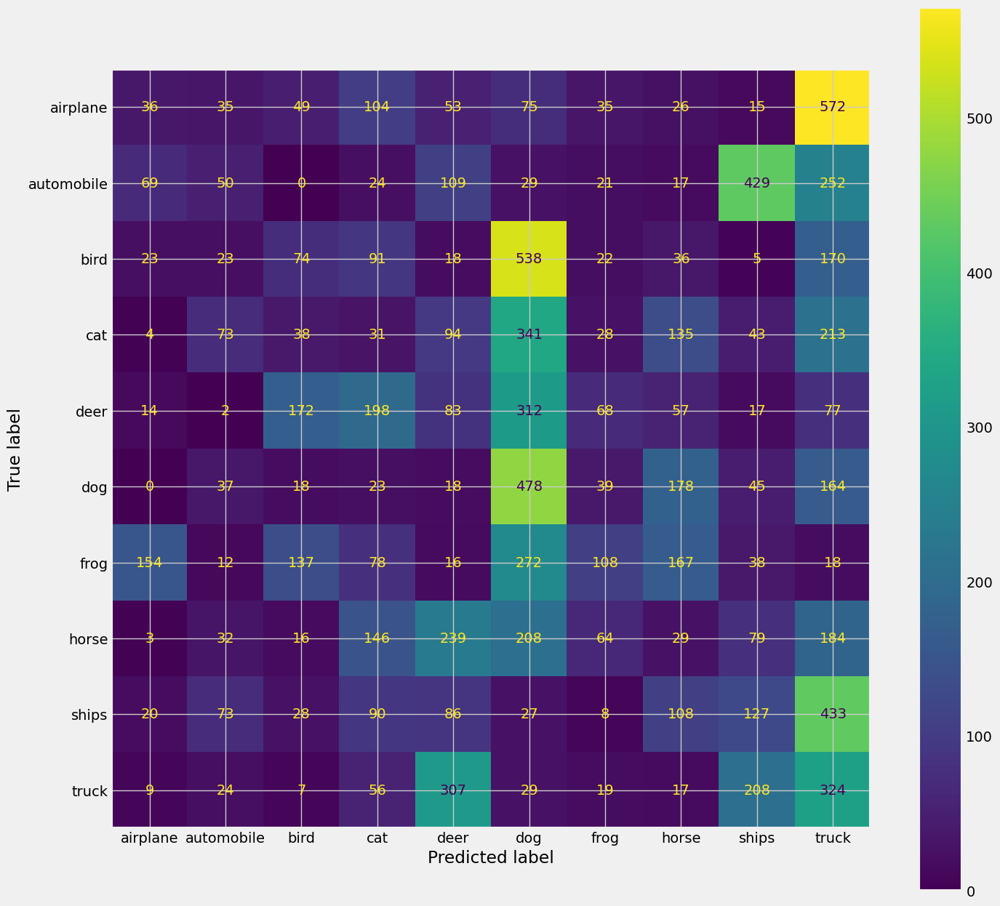

In [118]:
plot_testing(model, classes, X_test, Y_test)

### Retrain the Dense Layers for CIFAR10

We now Train the model on images. we are also checking to see if validation accuracy doesnt improve we will reduce learning rate though the callback

In [119]:
result=model.fit(
    train_datagen.flow(x_train, y_train, batch_size = 64),
    validation_data = (x_val, y_val),
    epochs = 30,
    verbose = 1,
    callbacks = [learning_rate_reduction]
)

Epoch 1/30


/home/mist861/.local/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


625/625 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.2205 - loss: 2.3823 - val_accuracy: 0.6099 - val_loss: 1.1501 - learning_rate: 1.0000e-04
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.5568 - loss: 1.2724 - val_accuracy: 0.6934 - val_loss: 0.8858 - learning_rate: 1.0000e-04
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6353 - loss: 1.0548 - val_accuracy: 0.7187 - val_loss: 0.8020 - learning_rate: 1.0000e-04
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6620 - loss: 0.9697 - val_accuracy: 0.7334 - val_loss: 0.7579 - learning_rate: 1.0000e-04
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6760 - loss: 0.9281 - val_accuracy: 0.7422 - val_loss: 0.7353 - learning_rate: 1.0000e-04
Epoch 6/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.6865 - loss: 0.8985 - val_accuracy: 0.7510 - val_loss: 0.7149 - learning_rate: 1.0000e-04
Epoch 7/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.69

In [120]:
model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 256)            │       330,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 338,592 (1.29 MB)

 Trainable params: 2,570 (10.04 KB)

 Non-trainable params: 330,880 (1.26 MB)

 Optimizer params: 5,142 (20.09 KB)

### Accuracy and Loss

{'accuracy': [0.3348250091075897, 0.5817999839782715, 0.6427000164985657, 0.6658499836921692, 0.6774500012397766, 0.6848999857902527, 0.692924976348877, 0.6996250152587891, 0.7057999968528748, 0.7062249779701233, 0.708899974822998, 0.7119749784469604, 0.7127249836921692, 0.7149999737739563, 0.7179250121116638, 0.7171499729156494, 0.715624988079071, 0.7219750285148621, 0.723675012588501, 0.7215750217437744, 0.7225000262260437, 0.7267000079154968, 0.7265999913215637, 0.7261499762535095, 0.7280250191688538, 0.7264999747276306, 0.7287999987602234, 0.7262250185012817, 0.7300750017166138, 0.7275750041007996], 'loss': [1.9475228786468506, 1.2064392566680908, 1.0321024656295776, 0.9618334770202637, 0.9248470664024353, 0.8972083926200867, 0.8768032193183899, 0.8595489263534546, 0.8463003039360046, 0.8381073474884033, 0.8298046588897705, 0.8272396326065063, 0.815558671951294, 0.8098398447036743, 0.8046876192092896, 0.8005765676498413, 0.799578070640564, 0.7901663184165955, 0.7847995758056641, 0.

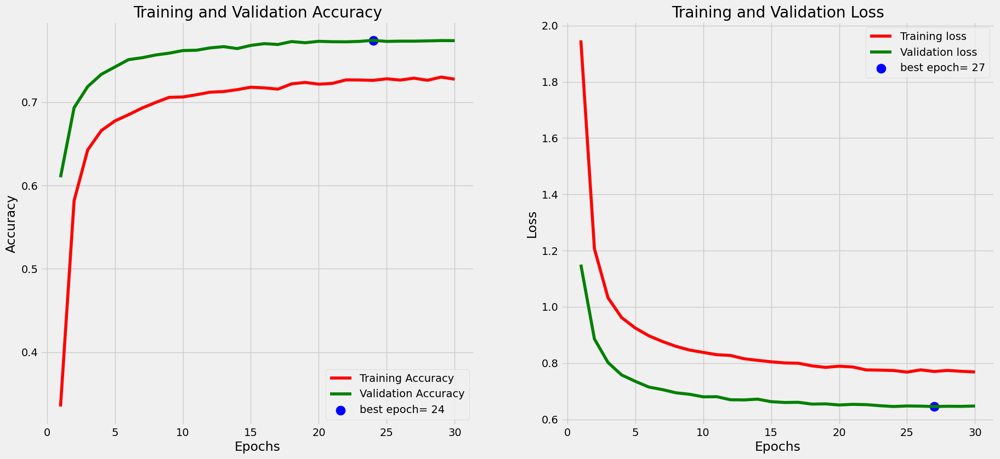

In [121]:
plot_training(result)

### Predictions,Accuracy and Confusion Matrix

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Testing Accuracy:  0.756


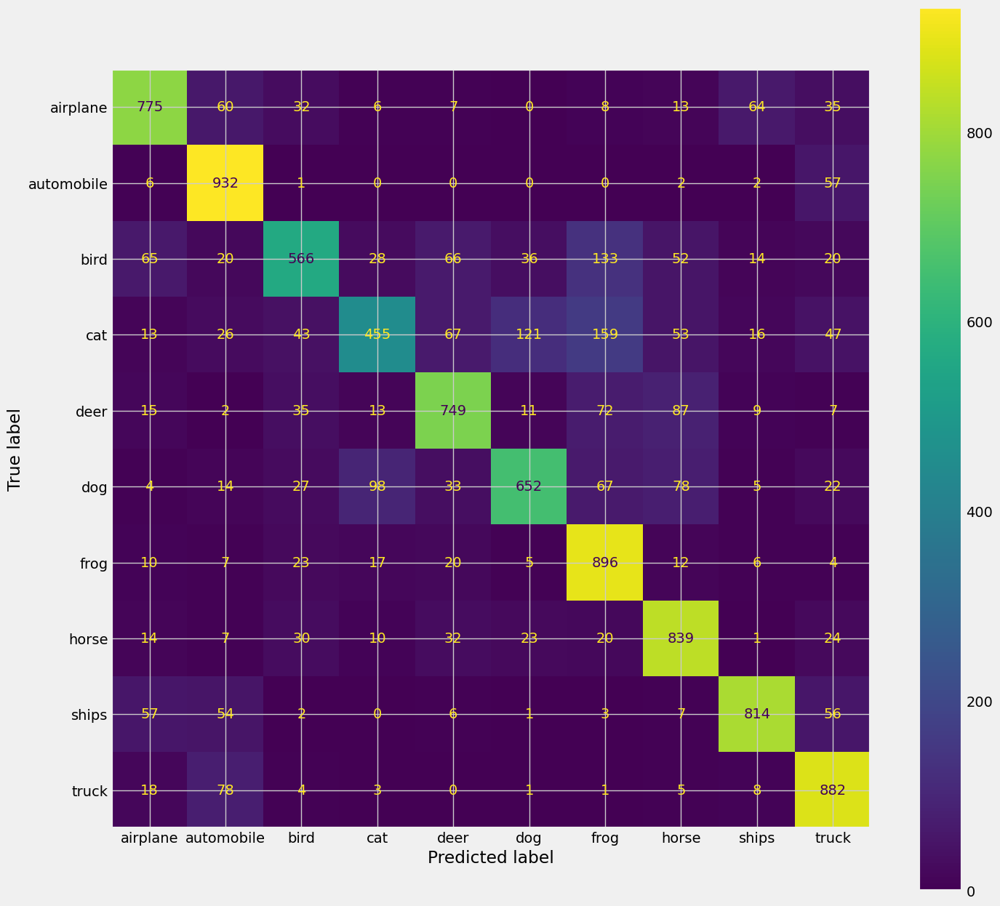

In [122]:
plot_testing(model, classes, X_test, Y_test)

# Graphing Results (All Models)

In [1]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots
import matplotlib.ticker as ticker
import seaborn as sns
import pandas as pd
import numpy as np

/home/mist861/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
cnn_results = pd.read_csv('./5567-0002_Final-Project-Results_Reed-White_12367576 - Custom CNN.csv', index_col=0).transpose()
resnet_results = pd.read_csv('./5567-0002_Final-Project-Results_Reed-White_12367576 - ResNet50.csv', index_col=0).transpose()
vgg_results = pd.read_csv('./5567-0002_Final-Project-Results_Reed-White_12367576 - VGG19.csv', index_col=0).transpose()
finetune_results = pd.read_csv('./5567-0002_Final-Project-Results_Reed-White_12367576 - Fine-Tuned CNN.csv', index_col=0).transpose()
cnn_results = cnn_results.drop('Notes', axis=1)
resnet_results = resnet_results.drop('Notes', axis=1)
vgg_results = vgg_results.drop('Notes', axis=1)
finetune_results = finetune_results.drop('Notes', axis=1)
cnn_results['Test Accuracy'] = cnn_results['Test Accuracy'].astype('float32')
cnn_results['Train Accuracy'] = cnn_results['Train Accuracy'].astype('float32')
resnet_results['Test Accuracy'] = resnet_results['Test Accuracy'].astype('float32')
resnet_results['Train Accuracy'] = resnet_results['Train Accuracy'].astype('float32')
vgg_results['Test Accuracy'] = vgg_results['Test Accuracy'].astype('float32')
vgg_results['Train Accuracy'] = vgg_results['Train Accuracy'].astype('float32')
finetune_results['Test Accuracy'] = finetune_results['Test Accuracy'].astype('float32')
finetune_results['Train Accuracy'] = finetune_results['Train Accuracy'].astype('float32')

In [3]:
cnn_results

Test,Conv Layers Outputs,Conv Layers Kernels,Dense Layers,Dense Neurons,Epochs,Batch Size,Optimizer,Learning Rate,Regularization,Train Accuracy,Val Accuracy,Train Loss,Val Loss,Test Accuracy
CIFAR10-1,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,SGD w/ Momentum,0.1,"Dropout (0.1), BatchNormalization, learning_ra...",0.537425,0.3133000135,1.292599082,2.844850063,0.3143
CIFAR10-2,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,SGD w/ Momentum,0.01,"Dropout (0.1), BatchNormalization, learning_ra...",0.807925,0.5451796651,0.8000000119,0.5906406641,0.3267
CIFAR10-3,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,SGD w/ Momentum,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.761225,0.7141000032,0.6788731217,0.8493422866,0.4180
CIFAR10-4,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,Adam,0.01,"Dropout (0.1), BatchNormalization, learning_ra...",0.762925,0.763100028,0.682561636,11.33429337,0.2694
CIFAR10-5,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.846100,0.826300025,0.4413871467,0.5115292668,0.4794
CIFAR10-6,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,Adam,0.0001,"Dropout (0.1), BatchNormalization, learning_ra...",0.789400,0.7491000295,0.6004796028,0.7758091092,0.4592
CIFAR10-7,"[32, 64, 64, 128, 128, 256]","[3, 3, 3, 3, 3, 3]",3,"[512, 256, 10]",20,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.857225,0.8277000189,0.4103517234,0.5088796616,0.3387
CIFAR10-8,"[32, 64, 128, 256]","[3, 3, 3, 3]",3,"[512, 256, 10]",20,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.867150,0.8282999992,0.3781689107,0.5491998196,0.4496
CIFAR10-9,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.877400,0.8375999928,0.3516962528,0.5181434155,0.4364
CIFAR10-10,"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.001,"Dropout (0.2), BatchNormalization, learning_ra...",0.859350,0.8368999958,0.4071038365,0.4971117079,0.4343


In [46]:
resnet_results

Test,Conv Layers Outputs,Conv Layers Kernels,Dense Layers,Dense Neurons,Epochs,Batch Size,Optimizer,Learning Rate,Regularization,Train Accuracy,Val Accuracy,Train Loss,Val Loss,Test Accuracy,NaN
CIFAR10 (IDENTICAL),ResNet50,ResNet50,3,"[512, 256, 10]",30,64,Adam,0.001,NaN,0.580075,0.4593999982,1.179602146,1.789289117,0.4640,
CIFAR10 (MODIFIED),ResNet50,ResNet50,3,"[512, 256, 10]",15,64,Adam,0.001,NaN,0.928650,0.9161999822,0.1982744932,0.2547131479,0.7194,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED
CIFAR100 (IDENTICAL),ResNet51,ResNet51,3,"[512, 256, 100]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.321675,0.08129999787,2.698745012,7.973543167,0.0789,
CIFAR100 (MODIFIED),ResNet52,ResNet52,3,"[512, 256, 100]",15,64,Adam,0.001,NaN,0.822675,0.7304999828,0.5565434098,1.016266227,0.7220,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED
Tiny ImageNet (IDENTICAL),ResNet53,ResNet53,3,"[512, 256, 200]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.179625,0.1165499985,3.760580063,4.413693905,0.1223,
Tiny ImageNet (MODIFIED),ResNet54,ResNet54,3,"[512, 256, 200]",15,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.750250,0.6993499994,0.8927538991,1.22311461,0.7035,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED


In [4]:
vgg_results

Test,Conv Layers Outputs,Conv Layers Kernels,Dense Layers,Dense Neurons,Epochs,Batch Size,Optimizer,Learning Rate,Regularization,Train Accuracy,Val Accuracy,Train Loss,Val Loss,Test Accuracy,NaN
CIFAR10 (IDENTICAL),VGG19,VGG19,3,"[512, 256, 10]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.661200,0.6535000205,0.9606268406,1.015571833,0.6534,
CIFAR10 (MODIFIED),VGG19,VGG19,3,"[512, 256, 10]",15,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.885725,0.8813999891,0.317452997,0.3791744411,0.8710,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED
CIFAR100 (IDENTICAL),VGG19,VGG19,3,"[512, 256, 100]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.402850,0.3499000072,2.299306154,2.676096201,0.3510,
CIFAR100 (MODIFIED),VGG19,VGG19,3,"[512, 256, 100]",15,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.727850,0.6674000025,0.8976697326,1.210276127,0.6679,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED
Tiny ImageNet (IDENTICAL),VGG19,VGG19,3,"[512, 256, 200]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.352525,0.3172999918,2.763024569,3.047771692,0.3259,
Tiny ImageNet (MODIFIED),VGG19,VGG19,3,"[512, 256, 200]",15,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.645875,0.6252499819,1.336553335,1.516863346,0.6216,MOSTLY THE DATALOADERS/PREPROCESSING WERE CHANGED


In [5]:
finetune_results

Test,Conv Layers Outputs,Conv Layers Kernels,Dense Layers,Dense Neurons,Epochs,Batch Size,Optimizer,Learning Rate,Regularization,Train Accuracy,Val Accuracy,Train Loss,Val Loss,Test Accuracy
Tiny ImageNet (UNFROZEN/Top Fully Removed),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 200]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.431525,0.3643999994,2.330119371,2.792565584,0.3667
CIFAR10 (Fully Removed w/o Training),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",NaN,NaN,NaN,NaN,0.0683
CIFAR10 (Fully Removed w/ Training),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.001,"Dropout (0.1), BatchNormalization, learning_ra...",0.822825,0.7926999927,0.4976896942,0.6254547238,0.7835
Tiny ImageNet (UNFROZEN/Only Output Removed),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 200]",30,64,Adam,0.0001,"Dropout (0.1), BatchNormalization, learning_ra...",0.329812,0.3055999875,2.871405125,3.03690958,0.3110
CIFAR10 (Output Only w/o Training),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.0001,"Dropout (0.1), BatchNormalization, learning_ra...",NaN,NaN,NaN,NaN,0.1340
CIFAR10 (Output Only w/ Training),"[32, 64, 64, 128]","[3, 3, 3, 3]",3,"[512, 256, 10]",30,64,Adam,0.0001,"Dropout (0.1), BatchNormalization, learning_ra...",0.727575,0.7738000154,0.7685004473,0.6474763155,0.7560


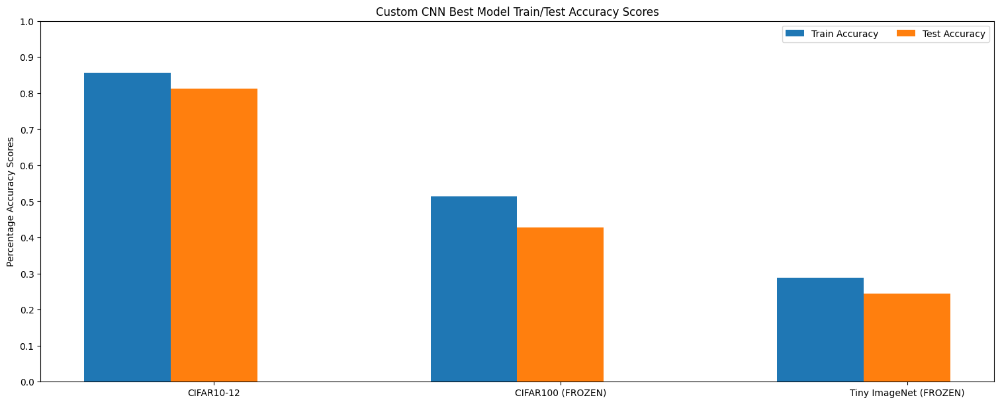

In [76]:
#fig, ax = plt.subplots(figsize=(15,6))
#bar_container = ax.bar(['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)'], cnn_results['Test Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']], width=0.5)
#ax.set(ylabel='Percentage Accuracy', xlabel='Dataset', title='Custom CNN Train/Test Accuracy Scores')

test_accuracies = cnn_results['Test Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']]
train_accuracies = cnn_results['Train Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']]
accuracies = {"Train Accuracy":train_accuracies.values,"Test Accuracy":test_accuracies.values}

x = np.arange(3)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Custom CNN Best Model Train/Test Accuracy Scores')
ax.set_xticks(x + width, ['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

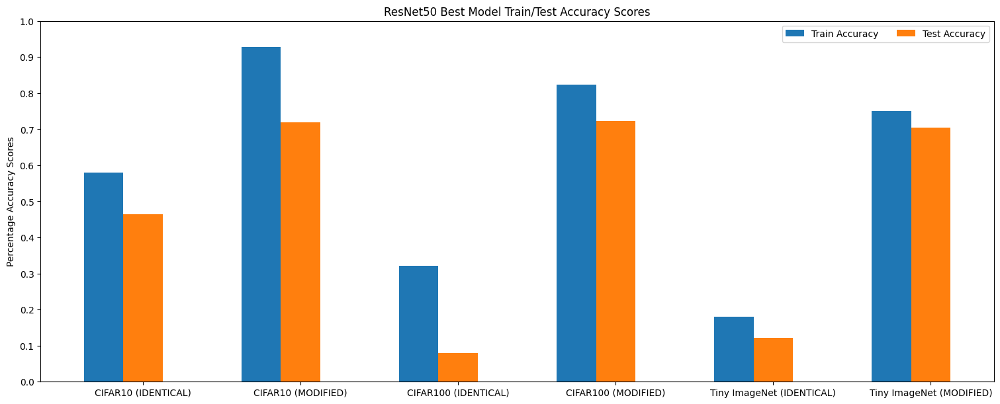

In [77]:
#fig, ax = plt.subplots(figsize=(15,6))
#bar_container = ax.bar(resnet_results.index, resnet_results['Test Accuracy'], width=0.5)
#ax.set(ylabel='Percentage Accuracy', xlabel='Dataset', title='ResNet50 Train/Test Accuracy Scores')

accuracies = {"Train Accuracy":resnet_results['Train Accuracy'].values,"Test Accuracy":resnet_results['Test Accuracy'].values}

x = np.arange(len(resnet_results.index))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('ResNet50 Best Model Train/Test Accuracy Scores')
ax.set_xticks(x + width, resnet_results.index)
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

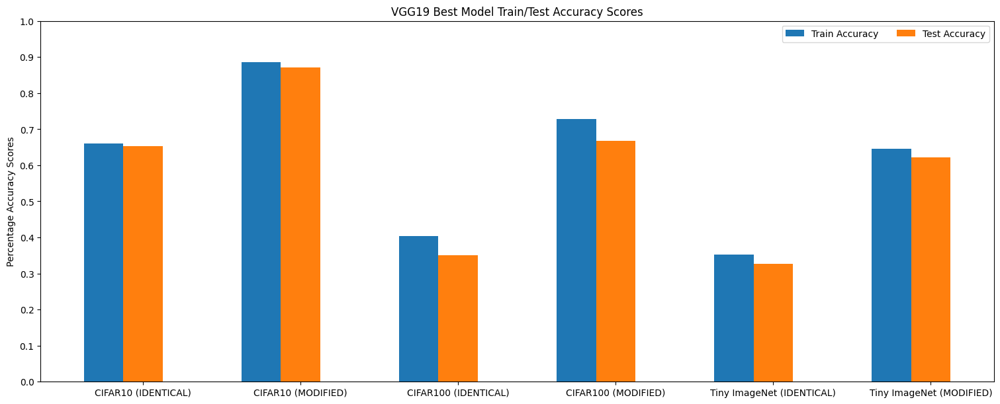

In [78]:
#fig, ax = plt.subplots(figsize=(15,6))
#bar_container = ax.bar(vgg_results.index, vgg_results['Test Accuracy'], width=0.5)
#ax.set(ylabel='Percentage Accuracy', xlabel='Dataset', title='VGG19 Train/Test Accuracy Scores')

accuracies = {"Train Accuracy":vgg_results['Train Accuracy'].values,"Test Accuracy":vgg_results['Test Accuracy'].values}

x = np.arange(len(vgg_results.index))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('VGG19 Best Model Train/Test Accuracy Scores')
ax.set_xticks(x + width, vgg_results.index)
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

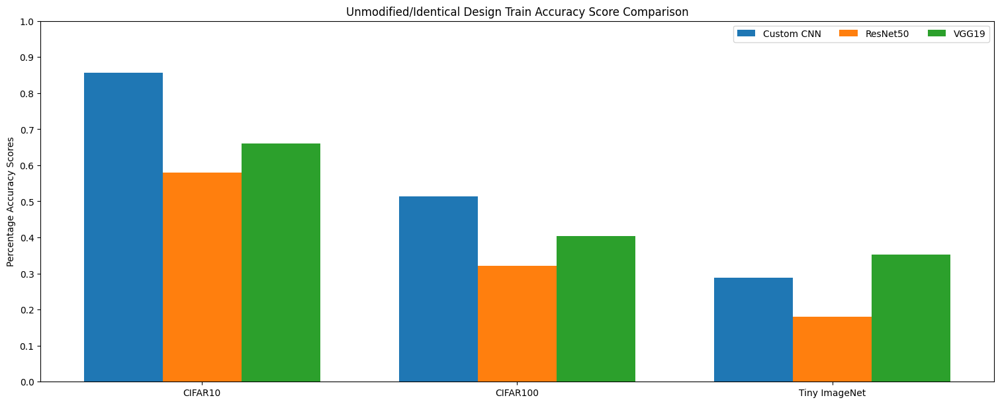

In [73]:
cnn_accuracies = cnn_results['Train Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']].values
resnet_accuracies = resnet_results['Train Accuracy'].loc[['CIFAR10 (IDENTICAL)', 'CIFAR100 (IDENTICAL)', 'Tiny ImageNet (IDENTICAL)']].values
vgg_accuracies = vgg_results['Train Accuracy'].loc[['CIFAR10 (IDENTICAL)', 'CIFAR100 (IDENTICAL)', 'Tiny ImageNet (IDENTICAL)']].values

accuracies = {'Custom CNN':cnn_accuracies,'ResNet50':resnet_accuracies,'VGG19':vgg_accuracies}

x = np.arange(3)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Unmodified/Identical Design Train Accuracy Score Comparison')
ax.set_xticks(x + width, ['CIFAR10', 'CIFAR100', 'Tiny ImageNet'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

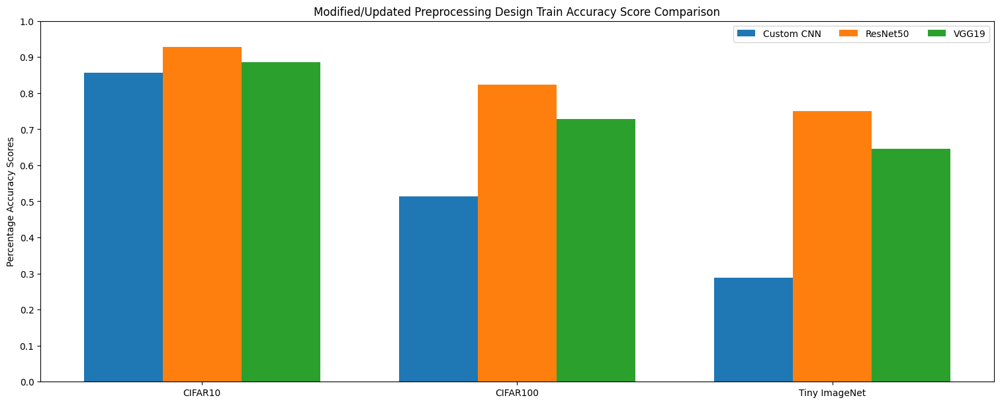

In [74]:
cnn_accuracies = cnn_results['Train Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']].values
resnet_accuracies = resnet_results['Train Accuracy'].loc[['CIFAR10 (MODIFIED)', 'CIFAR100 (MODIFIED)', 'Tiny ImageNet (MODIFIED)']].values
vgg_accuracies = vgg_results['Train Accuracy'].loc[['CIFAR10 (MODIFIED)', 'CIFAR100 (MODIFIED)', 'Tiny ImageNet (MODIFIED)']].values

accuracies = {'Custom CNN':cnn_accuracies,'ResNet50':resnet_accuracies,'VGG19':vgg_accuracies}

x = np.arange(3)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Modified/Updated Preprocessing Design Train Accuracy Score Comparison')
ax.set_xticks(x + width, ['CIFAR10', 'CIFAR100', 'Tiny ImageNet'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

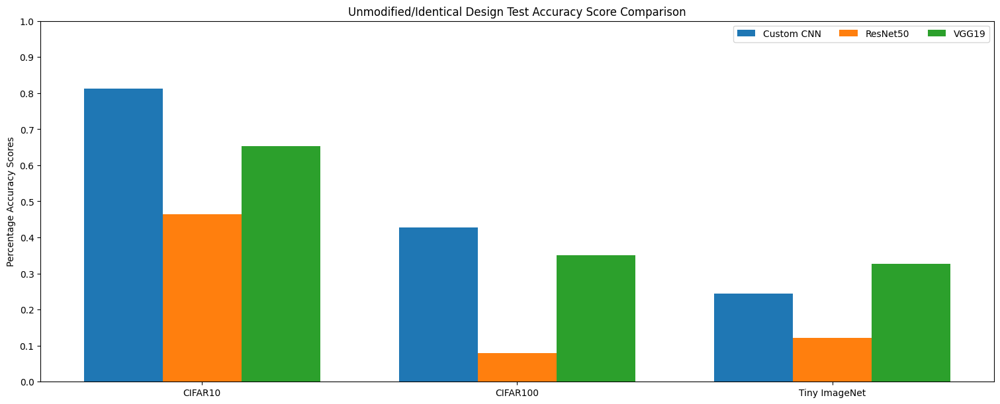

In [72]:
cnn_accuracies = cnn_results['Test Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']].values
resnet_accuracies = resnet_results['Test Accuracy'].loc[['CIFAR10 (IDENTICAL)', 'CIFAR100 (IDENTICAL)', 'Tiny ImageNet (IDENTICAL)']].values
vgg_accuracies = vgg_results['Test Accuracy'].loc[['CIFAR10 (IDENTICAL)', 'CIFAR100 (IDENTICAL)', 'Tiny ImageNet (IDENTICAL)']].values

accuracies = {'Custom CNN':cnn_accuracies,'ResNet50':resnet_accuracies,'VGG19':vgg_accuracies}

x = np.arange(3)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Unmodified/Identical Design Test Accuracy Score Comparison')
ax.set_xticks(x + width, ['CIFAR10', 'CIFAR100', 'Tiny ImageNet'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

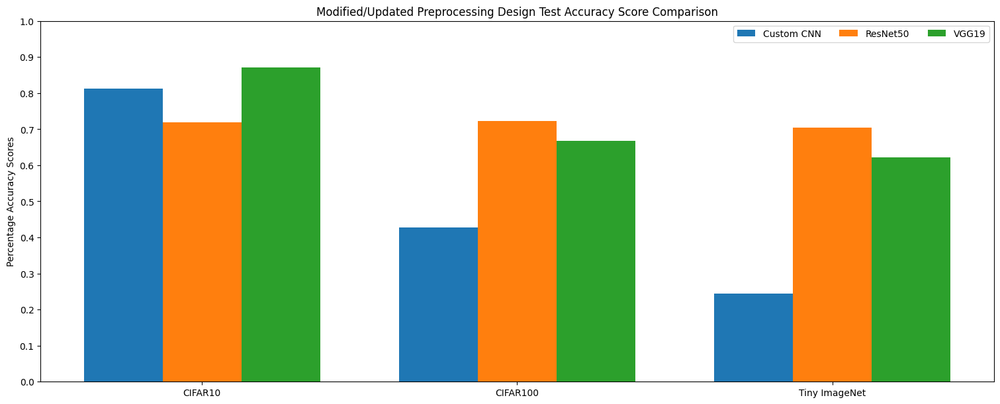

In [75]:
cnn_accuracies = cnn_results['Test Accuracy'].loc[['CIFAR10-12', 'CIFAR100 (FROZEN)', 'Tiny ImageNet (FROZEN)']].values
resnet_accuracies = resnet_results['Test Accuracy'].loc[['CIFAR10 (MODIFIED)', 'CIFAR100 (MODIFIED)', 'Tiny ImageNet (MODIFIED)']].values
vgg_accuracies = vgg_results['Test Accuracy'].loc[['CIFAR10 (MODIFIED)', 'CIFAR100 (MODIFIED)', 'Tiny ImageNet (MODIFIED)']].values

accuracies = {'Custom CNN':cnn_accuracies,'ResNet50':resnet_accuracies,'VGG19':vgg_accuracies}

x = np.arange(3)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Modified/Updated Preprocessing Design Test Accuracy Score Comparison')
ax.set_xticks(x + width, ['CIFAR10', 'CIFAR100', 'Tiny ImageNet'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()

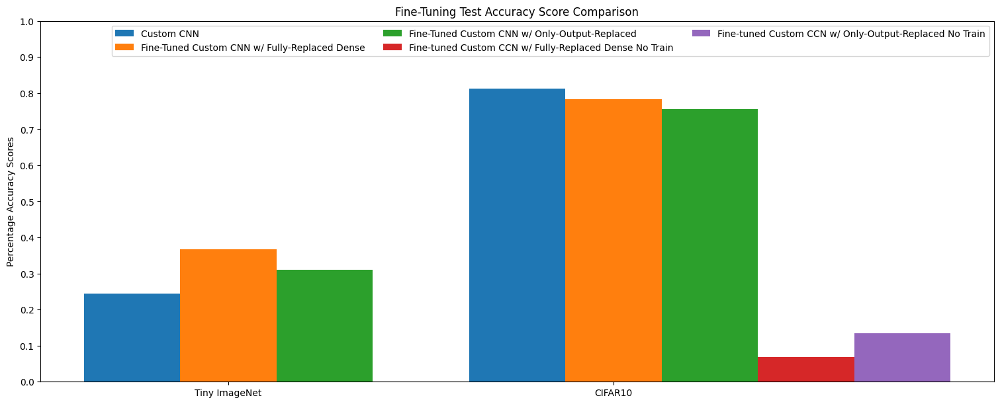

In [8]:
cnn_accuracies = cnn_results['Test Accuracy'].loc[['Tiny ImageNet (FROZEN)', 'CIFAR10-12']].values
finetune_full_results = finetune_results['Test Accuracy'].loc[['Tiny ImageNet (UNFROZEN/Top Fully Removed)', 'CIFAR10 (Fully Removed w/ Training)']].values
finetune_only_results = finetune_results['Test Accuracy'].loc[['Tiny ImageNet (UNFROZEN/Only Output Removed)', 'CIFAR10 (Output Only w/ Training)']].values
finetune_full_no_training_results = [0, finetune_results['Test Accuracy'].loc['CIFAR10 (Fully Removed w/o Training)']]
finetune_output_no_training_results = [0, finetune_results['Test Accuracy'].loc['CIFAR10 (Output Only w/o Training)']]


accuracies = {'Custom CNN':cnn_accuracies,
              'Fine-Tuned Custom CNN w/ Fully-Replaced Dense':finetune_full_results,
              'Fine-Tuned Custom CNN w/ Only-Output-Replaced':finetune_only_results,
              'Fine-tuned Custom CCN w/ Fully-Replaced Dense No Train':finetune_full_no_training_results,
              'Fine-tuned Custom CCN w/ Only-Output-Replaced No Train':finetune_output_no_training_results}

x = np.arange(2)  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(15,6),layout='constrained')

for attribute, measurement in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    #ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Percentage Accuracy Scores')
ax.set_title('Fine-Tuning Test Accuracy Score Comparison')
ax.set_xticks(x + width, ['Tiny ImageNet', 'CIFAR10'])
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax.set_ylim(0, 1)
ax.legend(loc='upper right', ncols=3)

plt.show()